In [1]:
import tensorflow
import cv2
import numpy as np
import os
from matplotlib import pyplot as plt
import time
import mediapipe as mp
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2


In [2]:
mp_holistic = mp.solutions.holistic
mp_drawing = mp.solutions.drawing_utils

def mp_detection(img, model):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img.flags.writeable = False
    result = model.process(img)
    img.flags.writeable = True
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    return img, result

def draw_landmark(image, result): 
    mp_drawing.draw_landmarks(image, result.pose_landmarks, mp_holistic.POSE_CONNECTIONS,
                             mp_drawing.DrawingSpec(color=(121,22,50), thickness=2, circle_radius=3), 
                             mp_drawing.DrawingSpec(color=(255,51,153), thickness=2, circle_radius=2)
                             ) 
    mp_drawing.draw_landmarks(image, result.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS, 
                             mp_drawing.DrawingSpec(color=(245,66,230), thickness=2, circle_radius=1), 
                             mp_drawing.DrawingSpec(color=(245,117,66), thickness=2, circle_radius=1)
                             ) 
    mp_drawing.draw_landmarks(image, result.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS, 
                             mp_drawing.DrawingSpec(color=(245,117,66), thickness=2, circle_radius=1), 
                             mp_drawing.DrawingSpec(color=(245,66,230), thickness=2, circle_radius=1)
                             )

In [4]:
cvc = cv2.VideoCapture(0)
with mp_holistic.Holistic(min_detection_confidence = 0.5, min_tracking_confidence = 0.5) as holistic:
    while cvc.isOpened():
        ret, frame = cvc.read()
        image, result = mp_detection(frame, holistic)
        print(result.face_landmarks)
        draw_landmark(image, result)
        cv2.imshow('OpenCV Feed', image)
        if cv2.waitKey(10) & 0xFF == ord('x'):
            break
cvc.release()
cv2.destroyAllWindows()

landmark {
  x: 0.49278542
  y: 0.63735247
  z: -0.0063290927
}
landmark {
  x: 0.48572636
  y: 0.61414856
  z: -0.02741853
}
landmark {
  x: 0.49140358
  y: 0.61851716
  z: -0.010617673
}
landmark {
  x: 0.4828837
  y: 0.5851206
  z: -0.024676125
}
landmark {
  x: 0.48470712
  y: 0.6068001
  z: -0.030983998
}
landmark {
  x: 0.48546275
  y: 0.59522885
  z: -0.031226775
}
landmark {
  x: 0.48951232
  y: 0.56346387
  z: -0.024468668
}
landmark {
  x: 0.45945147
  y: 0.55159724
  z: 0.010791199
}
landmark {
  x: 0.48987928
  y: 0.5431336
  z: -0.026376732
}
landmark {
  x: 0.4889805
  y: 0.5325282
  z: -0.03074697
}
landmark {
  x: 0.48927456
  y: 0.48440278
  z: -0.035917748
}
landmark {
  x: 0.49336964
  y: 0.64085937
  z: -0.0046973187
}
landmark {
  x: 0.49430913
  y: 0.6429258
  z: -0.0021138422
}
landmark {
  x: 0.49538547
  y: 0.64329386
  z: 0.00088689924
}
landmark {
  x: 0.49538633
  y: 0.6449579
  z: 0.004365275
}
landmark {
  x: 0.49522996
  y: 0.6485432
  z: 0.004271568
}
la

landmark {
  x: 0.49068022
  y: 0.6386629
  z: -0.010038701
}
landmark {
  x: 0.48494628
  y: 0.6153457
  z: -0.029599719
}
landmark {
  x: 0.49006858
  y: 0.6200308
  z: -0.012902437
}
landmark {
  x: 0.48193175
  y: 0.58715606
  z: -0.024685282
}
landmark {
  x: 0.4839808
  y: 0.6079921
  z: -0.032828197
}
landmark {
  x: 0.48484316
  y: 0.5966891
  z: -0.032303743
}
landmark {
  x: 0.48908103
  y: 0.56642735
  z: -0.022573814
}
landmark {
  x: 0.45770007
  y: 0.5569834
  z: 0.014303968
}
landmark {
  x: 0.48967507
  y: 0.54645914
  z: -0.022783035
}
landmark {
  x: 0.48881754
  y: 0.53613013
  z: -0.02623407
}
landmark {
  x: 0.48877755
  y: 0.4921404
  z: -0.027912267
}
landmark {
  x: 0.49109662
  y: 0.64243996
  z: -0.008493903
}
landmark {
  x: 0.49203262
  y: 0.6450224
  z: -0.00591648
}
landmark {
  x: 0.49323338
  y: 0.6458607
  z: -0.0028986342
}
landmark {
  x: 0.49302226
  y: 0.64880466
  z: 0.00014248939
}
landmark {
  x: 0.49284035
  y: 0.65274096
  z: -0.00015545767
}
l

landmark {
  x: 0.48992157
  y: 0.64300144
  z: -0.009310004
}
landmark {
  x: 0.48357213
  y: 0.6202991
  z: -0.0301453
}
landmark {
  x: 0.489074
  y: 0.6245023
  z: -0.012852129
}
landmark {
  x: 0.4806906
  y: 0.5906018
  z: -0.025394892
}
landmark {
  x: 0.4825689
  y: 0.61277246
  z: -0.033545867
}
landmark {
  x: 0.48349613
  y: 0.60085577
  z: -0.033106517
}
landmark {
  x: 0.48803112
  y: 0.5687254
  z: -0.02358118
}
landmark {
  x: 0.45660067
  y: 0.5567348
  z: 0.014435322
}
landmark {
  x: 0.48871067
  y: 0.548617
  z: -0.023876933
}
landmark {
  x: 0.4878422
  y: 0.53836095
  z: -0.027597101
}
landmark {
  x: 0.48796758
  y: 0.49250475
  z: -0.029768312
}
landmark {
  x: 0.49040136
  y: 0.6466854
  z: -0.007702866
}
landmark {
  x: 0.4913553
  y: 0.64901394
  z: -0.005133992
}
landmark {
  x: 0.4925653
  y: 0.64955115
  z: -0.0020991773
}
landmark {
  x: 0.49234876
  y: 0.6519406
  z: 0.00066803617
}
landmark {
  x: 0.49218056
  y: 0.65570843
  z: 0.00035776128
}
landmark 

landmark {
  x: 0.48927635
  y: 0.64409643
  z: -0.009514355
}
landmark {
  x: 0.4833711
  y: 0.62070036
  z: -0.030116038
}
landmark {
  x: 0.48864812
  y: 0.6250219
  z: -0.012843613
}
landmark {
  x: 0.48059487
  y: 0.5914699
  z: -0.025350016
}
landmark {
  x: 0.4824252
  y: 0.61330855
  z: -0.033495754
}
landmark {
  x: 0.4833773
  y: 0.6015973
  z: -0.03304257
}
landmark {
  x: 0.48794144
  y: 0.56976086
  z: -0.0234719
}
landmark {
  x: 0.45643964
  y: 0.55805206
  z: 0.014195611
}
landmark {
  x: 0.4886655
  y: 0.54995847
  z: -0.02375481
}
landmark {
  x: 0.48784506
  y: 0.5398356
  z: -0.027474446
}
landmark {
  x: 0.48798335
  y: 0.49374726
  z: -0.029446978
}
landmark {
  x: 0.48970598
  y: 0.64784706
  z: -0.007940359
}
landmark {
  x: 0.49063253
  y: 0.65028286
  z: -0.005343915
}
landmark {
  x: 0.49182996
  y: 0.65093285
  z: -0.0023051717
}
landmark {
  x: 0.49159935
  y: 0.6532544
  z: 0.0005520242
}
landmark {
  x: 0.49141023
  y: 0.6571443
  z: 0.0002479326
}
landma

landmark {
  x: 0.48989853
  y: 0.6440536
  z: -0.009241412
}
landmark {
  x: 0.48403633
  y: 0.62083906
  z: -0.029928295
}
landmark {
  x: 0.48923713
  y: 0.62516284
  z: -0.012666911
}
landmark {
  x: 0.48108038
  y: 0.5913645
  z: -0.025342185
}
landmark {
  x: 0.48307115
  y: 0.61340755
  z: -0.033326454
}
landmark {
  x: 0.4839443
  y: 0.60160685
  z: -0.03291812
}
landmark {
  x: 0.48828366
  y: 0.5694769
  z: -0.023538742
}
landmark {
  x: 0.45653838
  y: 0.5576864
  z: 0.013734951
}
landmark {
  x: 0.48888963
  y: 0.5495543
  z: -0.023983497
}
landmark {
  x: 0.48803762
  y: 0.5393148
  z: -0.027761465
}
landmark {
  x: 0.4880949
  y: 0.49324638
  z: -0.030016366
}
landmark {
  x: 0.49034166
  y: 0.6477268
  z: -0.0076372465
}
landmark {
  x: 0.4912503
  y: 0.6500014
  z: -0.0050457097
}
landmark {
  x: 0.49241576
  y: 0.6505085
  z: -0.0019938208
}
landmark {
  x: 0.49219498
  y: 0.6526638
  z: 0.0009031598
}
landmark {
  x: 0.49202168
  y: 0.6563511
  z: 0.00061507616
}
land

landmark {
  x: 0.48976192
  y: 0.6449511
  z: -0.008880836
}
landmark {
  x: 0.48406377
  y: 0.62199193
  z: -0.029660637
}
landmark {
  x: 0.4891439
  y: 0.62609166
  z: -0.012401378
}
landmark {
  x: 0.481086
  y: 0.5923214
  z: -0.025331262
}
landmark {
  x: 0.4831272
  y: 0.61459076
  z: -0.033096697
}
landmark {
  x: 0.48397663
  y: 0.60271615
  z: -0.032769863
}
landmark {
  x: 0.48820677
  y: 0.57024914
  z: -0.023694808
}
landmark {
  x: 0.45624927
  y: 0.557994
  z: 0.013234999
}
landmark {
  x: 0.48878938
  y: 0.55037063
  z: -0.02429684
}
landmark {
  x: 0.4879406
  y: 0.5401768
  z: -0.028156647
}
landmark {
  x: 0.48795477
  y: 0.49389058
  z: -0.030702546
}
landmark {
  x: 0.49018556
  y: 0.6485575
  z: -0.0072523504
}
landmark {
  x: 0.4910743
  y: 0.65075254
  z: -0.0046407953
}
landmark {
  x: 0.4922097
  y: 0.65118855
  z: -0.0015882148
}
landmark {
  x: 0.49195367
  y: 0.65318424
  z: 0.0013504751
}
landmark {
  x: 0.49178326
  y: 0.65677476
  z: 0.0010933701
}
land

landmark {
  x: 0.48960343
  y: 0.64206946
  z: -0.009272696
}
landmark {
  x: 0.48312113
  y: 0.6200701
  z: -0.029659556
}
landmark {
  x: 0.48856354
  y: 0.6239929
  z: -0.0125486925
}
landmark {
  x: 0.47975048
  y: 0.5907712
  z: -0.025039444
}
landmark {
  x: 0.48200792
  y: 0.6127038
  z: -0.033021234
}
landmark {
  x: 0.48270756
  y: 0.60093164
  z: -0.032614995
}
landmark {
  x: 0.48660943
  y: 0.5688421
  z: -0.023284748
}
landmark {
  x: 0.4549804
  y: 0.5576576
  z: 0.014137068
}
landmark {
  x: 0.48688093
  y: 0.5487127
  z: -0.02371833
}
landmark {
  x: 0.48582995
  y: 0.5384484
  z: -0.027467757
}
landmark {
  x: 0.48526946
  y: 0.49294552
  z: -0.029738342
}
landmark {
  x: 0.49011758
  y: 0.6456596
  z: -0.0076929918
}
landmark {
  x: 0.49108964
  y: 0.64793795
  z: -0.005108417
}
landmark {
  x: 0.49229905
  y: 0.6484577
  z: -0.0020741674
}
landmark {
  x: 0.49211034
  y: 0.65086335
  z: 0.0009385925
}
landmark {
  x: 0.49199787
  y: 0.65457094
  z: 0.0006663663
}
la

landmark {
  x: 0.48653144
  y: 0.6392357
  z: -0.011040542
}
landmark {
  x: 0.48010737
  y: 0.6148487
  z: -0.030252352
}
landmark {
  x: 0.48542842
  y: 0.62010574
  z: -0.013524387
}
landmark {
  x: 0.4770754
  y: 0.5855845
  z: -0.02446373
}
landmark {
  x: 0.47912544
  y: 0.6070644
  z: -0.03336561
}
landmark {
  x: 0.47996733
  y: 0.5952307
  z: -0.03251913
}
landmark {
  x: 0.48397192
  y: 0.5639306
  z: -0.021792898
}
landmark {
  x: 0.45249072
  y: 0.555584
  z: 0.016084798
}
landmark {
  x: 0.48434708
  y: 0.5444385
  z: -0.021366905
}
landmark {
  x: 0.48337057
  y: 0.5339916
  z: -0.024584498
}
landmark {
  x: 0.48320687
  y: 0.48803437
  z: -0.024974009
}
landmark {
  x: 0.4870385
  y: 0.6430602
  z: -0.009583808
}
landmark {
  x: 0.48798946
  y: 0.64546824
  z: -0.0071023135
}
landmark {
  x: 0.48913044
  y: 0.6459911
  z: -0.0041341092
}
landmark {
  x: 0.48874244
  y: 0.64782876
  z: -0.0019553073
}
landmark {
  x: 0.48857123
  y: 0.65147454
  z: -0.0023613952
}
landma

landmark {
  x: 0.48840797
  y: 0.6346676
  z: -0.011394716
}
landmark {
  x: 0.4811575
  y: 0.60950345
  z: -0.030356964
}
landmark {
  x: 0.48681983
  y: 0.6150602
  z: -0.013704039
}
landmark {
  x: 0.47782716
  y: 0.5804014
  z: -0.02427284
}
landmark {
  x: 0.47999108
  y: 0.6015966
  z: -0.033393152
}
landmark {
  x: 0.4806906
  y: 0.5897917
  z: -0.03245276
}
landmark {
  x: 0.4845596
  y: 0.55872
  z: -0.021462712
}
landmark {
  x: 0.45369264
  y: 0.5520967
  z: 0.01707916
}
landmark {
  x: 0.4846965
  y: 0.5387632
  z: -0.02079448
}
landmark {
  x: 0.48349252
  y: 0.52813727
  z: -0.023861542
}
landmark {
  x: 0.4825531
  y: 0.48286223
  z: -0.023899881
}
landmark {
  x: 0.4890422
  y: 0.6385345
  z: -0.010006755
}
landmark {
  x: 0.49015158
  y: 0.6409798
  z: -0.007604312
}
landmark {
  x: 0.4914333
  y: 0.6415571
  z: -0.0046424535
}
landmark {
  x: 0.49138796
  y: 0.64481527
  z: -0.0024749294
}
landmark {
  x: 0.4912974
  y: 0.64859104
  z: -0.0029039863
}
landmark {
  x:

landmark {
  x: 0.496454
  y: 0.6309643
  z: -0.011928161
}
landmark {
  x: 0.49023464
  y: 0.6072567
  z: -0.031102933
}
landmark {
  x: 0.4955046
  y: 0.61238146
  z: -0.014149967
}
landmark {
  x: 0.48728678
  y: 0.5770742
  z: -0.02470168
}
landmark {
  x: 0.48927635
  y: 0.599157
  z: -0.034142192
}
landmark {
  x: 0.4901476
  y: 0.5869647
  z: -0.033078272
}
landmark {
  x: 0.49441546
  y: 0.5550138
  z: -0.021534303
}
landmark {
  x: 0.4626531
  y: 0.54682976
  z: 0.017379843
}
landmark {
  x: 0.49504545
  y: 0.5354904
  z: -0.020605847
}
landmark {
  x: 0.49410528
  y: 0.5249015
  z: -0.02358889
}
landmark {
  x: 0.49388313
  y: 0.47847673
  z: -0.022926686
}
landmark {
  x: 0.49695852
  y: 0.6347781
  z: -0.010543951
}
landmark {
  x: 0.49794915
  y: 0.6371814
  z: -0.008108803
}
landmark {
  x: 0.49916017
  y: 0.6377068
  z: -0.005097417
}
landmark {
  x: 0.49896303
  y: 0.6404091
  z: -0.0032135025
}
landmark {
  x: 0.49879625
  y: 0.6440439
  z: -0.003708847
}
landmark {
  

landmark {
  x: 0.51217836
  y: 0.6252215
  z: -0.013428399
}
landmark {
  x: 0.5074544
  y: 0.6002592
  z: -0.032584477
}
landmark {
  x: 0.51186585
  y: 0.6061904
  z: -0.015201233
}
landmark {
  x: 0.5052345
  y: 0.57057303
  z: -0.025510492
}
landmark {
  x: 0.5069095
  y: 0.59201777
  z: -0.035525836
}
landmark {
  x: 0.50811905
  y: 0.58010036
  z: -0.03418117
}
landmark {
  x: 0.51299876
  y: 0.54942185
  z: -0.021350566
}
landmark {
  x: 0.47923955
  y: 0.5415499
  z: 0.017130597
}
landmark {
  x: 0.51432997
  y: 0.52985
  z: -0.019811172
}
landmark {
  x: 0.51391053
  y: 0.51923734
  z: -0.02265098
}
landmark {
  x: 0.5151065
  y: 0.4746677
  z: -0.020936096
}
landmark {
  x: 0.512496
  y: 0.62914497
  z: -0.012118136
}
landmark {
  x: 0.51334405
  y: 0.6318264
  z: -0.009690228
}
landmark {
  x: 0.5144295
  y: 0.6326265
  z: -0.006617749
}
landmark {
  x: 0.514481
  y: 0.63537157
  z: -0.004643821
}
landmark {
  x: 0.5142014
  y: 0.6391657
  z: -0.005266311
}
landmark {
  x: 

landmark {
  x: 0.5197244
  y: 0.6254317
  z: -0.012614824
}
landmark {
  x: 0.51487565
  y: 0.60186785
  z: -0.031715453
}
landmark {
  x: 0.51953703
  y: 0.6071593
  z: -0.014572848
}
landmark {
  x: 0.5128725
  y: 0.5721081
  z: -0.025232052
}
landmark {
  x: 0.51432353
  y: 0.59377176
  z: -0.034719206
}
landmark {
  x: 0.51559407
  y: 0.581894
  z: -0.03352045
}
landmark {
  x: 0.52064896
  y: 0.55095017
  z: -0.021393713
}
landmark {
  x: 0.48718333
  y: 0.5412625
  z: 0.015666623
}
landmark {
  x: 0.5219576
  y: 0.53108656
  z: -0.020151261
}
landmark {
  x: 0.52151453
  y: 0.52054477
  z: -0.023122257
}
landmark {
  x: 0.52275854
  y: 0.47512725
  z: -0.022176899
}
landmark {
  x: 0.5200607
  y: 0.6292605
  z: -0.011299751
}
landmark {
  x: 0.5208757
  y: 0.631927
  z: -0.008885031
}
landmark {
  x: 0.5219233
  y: 0.6327963
  z: -0.00588037
}
landmark {
  x: 0.52174306
  y: 0.63505787
  z: -0.0036951515
}
landmark {
  x: 0.5214171
  y: 0.6388658
  z: -0.00424539
}
landmark {
  

landmark {
  x: 0.5145154
  y: 0.6178648
  z: -0.014416349
}
landmark {
  x: 0.5083547
  y: 0.5918982
  z: -0.031724527
}
landmark {
  x: 0.51381975
  y: 0.598225
  z: -0.015485056
}
landmark {
  x: 0.5062269
  y: 0.5634976
  z: -0.02344483
}
landmark {
  x: 0.5076344
  y: 0.5837788
  z: -0.034263078
}
landmark {
  x: 0.5088209
  y: 0.5723892
  z: -0.032482382
}
landmark {
  x: 0.51374656
  y: 0.5433101
  z: -0.01863688
}
landmark {
  x: 0.48172918
  y: 0.5370845
  z: 0.01995057
}
landmark {
  x: 0.5147522
  y: 0.52463907
  z: -0.015973832
}
landmark {
  x: 0.5141322
  y: 0.5141313
  z: -0.01815017
}
landmark {
  x: 0.51515007
  y: 0.46918234
  z: -0.01435518
}
landmark {
  x: 0.5149697
  y: 0.621669
  z: -0.013341929
}
landmark {
  x: 0.5158271
  y: 0.6241712
  z: -0.0111292945
}
landmark {
  x: 0.51689726
  y: 0.6248914
  z: -0.008373456
}
landmark {
  x: 0.5166977
  y: 0.6266869
  z: -0.006816117
}
landmark {
  x: 0.5164242
  y: 0.6299247
  z: -0.007639657
}
landmark {
  x: 0.516540

landmark {
  x: 0.5070846
  y: 0.6230005
  z: -0.012915106
}
landmark {
  x: 0.50027406
  y: 0.5965109
  z: -0.030917596
}
landmark {
  x: 0.506118
  y: 0.6026474
  z: -0.014606323
}
landmark {
  x: 0.49770045
  y: 0.56809396
  z: -0.023478277
}
landmark {
  x: 0.49930164
  y: 0.5885806
  z: -0.033635024
}
landmark {
  x: 0.5002918
  y: 0.5771406
  z: -0.032216225
}
landmark {
  x: 0.50484735
  y: 0.54719424
  z: -0.01960468
}
landmark {
  x: 0.47384888
  y: 0.54121274
  z: 0.01918242
}
landmark {
  x: 0.5054818
  y: 0.5280303
  z: -0.017732002
}
landmark {
  x: 0.504569
  y: 0.51746464
  z: -0.020274337
}
landmark {
  x: 0.5047457
  y: 0.47261074
  z: -0.018132508
}
landmark {
  x: 0.5076242
  y: 0.62684923
  z: -0.011688831
}
landmark {
  x: 0.5085941
  y: 0.6292494
  z: -0.00941031
}
landmark {
  x: 0.50976527
  y: 0.6298001
  z: -0.00663661
}
landmark {
  x: 0.50960195
  y: 0.6310598
  z: -0.0050890623
}
landmark {
  x: 0.5093631
  y: 0.63438153
  z: -0.005762888
}
landmark {
  x: 

landmark {
  x: 0.50527626
  y: 0.62396836
  z: -0.012355864
}
landmark {
  x: 0.49925727
  y: 0.6000846
  z: -0.030224977
}
landmark {
  x: 0.504244
  y: 0.6055486
  z: -0.013978248
}
landmark {
  x: 0.49628896
  y: 0.5711414
  z: -0.023798013
}
landmark {
  x: 0.49837467
  y: 0.5921503
  z: -0.033063382
}
landmark {
  x: 0.49917215
  y: 0.58046615
  z: -0.03188158
}
landmark {
  x: 0.5030256
  y: 0.5499827
  z: -0.020154556
}
landmark {
  x: 0.47107333
  y: 0.5432033
  z: 0.015878893
}
landmark {
  x: 0.5035105
  y: 0.5305466
  z: -0.01900517
}
landmark {
  x: 0.5026568
  y: 0.52007365
  z: -0.021785723
}
landmark {
  x: 0.50241256
  y: 0.4754364
  z: -0.02065771
}
landmark {
  x: 0.5057896
  y: 0.62779576
  z: -0.011108358
}
landmark {
  x: 0.5067157
  y: 0.6303912
  z: -0.008759469
}
landmark {
  x: 0.5078183
  y: 0.6311426
  z: -0.0058974274
}
landmark {
  x: 0.5077669
  y: 0.63301677
  z: -0.004021645
}
landmark {
  x: 0.5075986
  y: 0.6367289
  z: -0.0045204815
}
landmark {
  x:

landmark {
  x: 0.506899
  y: 0.6210742
  z: -0.01337222
}
landmark {
  x: 0.5013813
  y: 0.5976226
  z: -0.03067024
}
landmark {
  x: 0.50607836
  y: 0.60332805
  z: -0.014546684
}
landmark {
  x: 0.49856365
  y: 0.5682379
  z: -0.023353428
}
landmark {
  x: 0.5005369
  y: 0.58944905
  z: -0.033341754
}
landmark {
  x: 0.5013828
  y: 0.57756525
  z: -0.031848248
}
landmark {
  x: 0.5053567
  y: 0.54704434
  z: -0.019300621
}
landmark {
  x: 0.47380358
  y: 0.5408391
  z: 0.01838869
}
landmark {
  x: 0.5059458
  y: 0.52806437
  z: -0.017544314
}
landmark {
  x: 0.5050798
  y: 0.51750493
  z: -0.019972615
}
landmark {
  x: 0.5049885
  y: 0.47187722
  z: -0.017423984
}
landmark {
  x: 0.50733966
  y: 0.6248677
  z: -0.012261131
}
landmark {
  x: 0.5082574
  y: 0.62740976
  z: -0.01002034
}
landmark {
  x: 0.50938845
  y: 0.62812483
  z: -0.007176036
}
landmark {
  x: 0.50922614
  y: 0.6310359
  z: -0.00549395
}
landmark {
  x: 0.5090563
  y: 0.634646
  z: -0.0061007915
}
landmark {
  x: 

landmark {
  x: 0.5100002
  y: 0.6188893
  z: -0.012822722
}
landmark {
  x: 0.5046139
  y: 0.5946368
  z: -0.0305288
}
landmark {
  x: 0.50922155
  y: 0.6005511
  z: -0.014330919
}
landmark {
  x: 0.50203294
  y: 0.56555337
  z: -0.023649434
}
landmark {
  x: 0.5038713
  y: 0.586557
  z: -0.033283863
}
landmark {
  x: 0.5048177
  y: 0.57484025
  z: -0.031944264
}
landmark {
  x: 0.509022
  y: 0.54461354
  z: -0.0197761
}
landmark {
  x: 0.47731966
  y: 0.53779364
  z: 0.017140884
}
landmark {
  x: 0.5098066
  y: 0.52552325
  z: -0.018300602
}
landmark {
  x: 0.5090993
  y: 0.514946
  z: -0.020882795
}
landmark {
  x: 0.50956196
  y: 0.4697055
  z: -0.019036978
}
landmark {
  x: 0.5104204
  y: 0.62271386
  z: -0.011633616
}
landmark {
  x: 0.51129913
  y: 0.6252202
  z: -0.009351975
}
landmark {
  x: 0.51240075
  y: 0.6258873
  z: -0.0064832014
}
landmark {
  x: 0.5122758
  y: 0.62835133
  z: -0.0048165363
}
landmark {
  x: 0.5120763
  y: 0.6319194
  z: -0.0053888327
}
landmark {
  x: 

landmark {
  x: 0.51071775
  y: 0.6066424
  z: -0.014094167
}
landmark {
  x: 0.5055533
  y: 0.5812088
  z: -0.030858481
}
landmark {
  x: 0.5102129
  y: 0.58768266
  z: -0.014971372
}
landmark {
  x: 0.50313574
  y: 0.5528449
  z: -0.023072368
}
landmark {
  x: 0.50483376
  y: 0.5731635
  z: -0.03341763
}
landmark {
  x: 0.5058231
  y: 0.5616906
  z: -0.031798255
}
landmark {
  x: 0.5100704
  y: 0.5324605
  z: -0.01876802
}
landmark {
  x: 0.47920012
  y: 0.5274192
  z: 0.01952488
}
landmark {
  x: 0.5108203
  y: 0.51472425
  z: -0.016743124
}
landmark {
  x: 0.5100684
  y: 0.5044395
  z: -0.019015413
}
landmark {
  x: 0.5107194
  y: 0.459409
  z: -0.015598187
}
landmark {
  x: 0.51112306
  y: 0.6105907
  z: -0.013012214
}
landmark {
  x: 0.51201206
  y: 0.6131847
  z: -0.01076485
}
landmark {
  x: 0.5131359
  y: 0.61394227
  z: -0.007913249
}
landmark {
  x: 0.51299024
  y: 0.6156057
  z: -0.0064452556
}
landmark {
  x: 0.5127568
  y: 0.61911535
  z: -0.0071030254
}
landmark {
  x: 0

landmark {
  x: 0.52165544
  y: 0.56796277
  z: -0.015570923
}
landmark {
  x: 0.51740026
  y: 0.5424869
  z: -0.029085442
}
landmark {
  x: 0.52130926
  y: 0.55043143
  z: -0.015090085
}
landmark {
  x: 0.51514536
  y: 0.51831025
  z: -0.020094644
}
landmark {
  x: 0.5168069
  y: 0.5347993
  z: -0.030994374
}
landmark {
  x: 0.5177022
  y: 0.52490723
  z: -0.028814537
}
landmark {
  x: 0.52154994
  y: 0.5009217
  z: -0.014689
}
landmark {
  x: 0.49198672
  y: 0.5024744
  z: 0.020656267
}
landmark {
  x: 0.5222755
  y: 0.4845127
  z: -0.011426996
}
landmark {
  x: 0.5216086
  y: 0.47466648
  z: -0.012839384
}
landmark {
  x: 0.52209276
  y: 0.4337404
  z: -0.0068862927
}
landmark {
  x: 0.5219893
  y: 0.5717103
  z: -0.0149157215
}
landmark {
  x: 0.52282596
  y: 0.5744571
  z: -0.013056455
}
landmark {
  x: 0.52387923
  y: 0.575602
  z: -0.010589422
}
landmark {
  x: 0.5240909
  y: 0.57710326
  z: -0.009804415
}
landmark {
  x: 0.523865
  y: 0.58029205
  z: -0.010578448
}
landmark {
 

landmark {
  x: 0.5424204
  y: 0.54527754
  z: -0.017043803
}
landmark {
  x: 0.5388039
  y: 0.5196653
  z: -0.027999448
}
landmark {
  x: 0.54216284
  y: 0.52841794
  z: -0.015463907
}
landmark {
  x: 0.5368973
  y: 0.49799073
  z: -0.018159749
}
landmark {
  x: 0.5384284
  y: 0.5122668
  z: -0.029405564
}
landmark {
  x: 0.53937125
  y: 0.5034141
  z: -0.026837634
}
landmark {
  x: 0.54311794
  y: 0.48292607
  z: -0.0117046535
}
landmark {
  x: 0.515184
  y: 0.4879615
  z: 0.020931475
}
landmark {
  x: 0.5442773
  y: 0.4691356
  z: -0.0075252173
}
landmark {
  x: 0.54405797
  y: 0.45998642
  z: -0.007984269
}
landmark {
  x: 0.5455247
  y: 0.4235605
  z: 0.00037837043
}
landmark {
  x: 0.5426354
  y: 0.548821
  z: -0.016572129
}
landmark {
  x: 0.5433371
  y: 0.55167866
  z: -0.014925206
}
landmark {
  x: 0.5442375
  y: 0.5530506
  z: -0.012642717
}
landmark {
  x: 0.5440848
  y: 0.55530375
  z: -0.011902646
}
landmark {
  x: 0.54384464
  y: 0.55822694
  z: -0.012819728
}
landmark {


landmark {
  x: 0.5615221
  y: 0.53717417
  z: -0.017526468
}
landmark {
  x: 0.55746883
  y: 0.51115173
  z: -0.027065579
}
landmark {
  x: 0.5611832
  y: 0.52075756
  z: -0.015580558
}
landmark {
  x: 0.5564612
  y: 0.49006197
  z: -0.016515194
}
landmark {
  x: 0.5571985
  y: 0.50365764
  z: -0.02813362
}
landmark {
  x: 0.55844617
  y: 0.4950743
  z: -0.025284017
}
landmark {
  x: 0.5630694
  y: 0.47579896
  z: -0.0096668
}
landmark {
  x: 0.536904
  y: 0.4818854
  z: 0.02270501
}
landmark {
  x: 0.56475306
  y: 0.4620104
  z: -0.0047257147
}
landmark {
  x: 0.56470823
  y: 0.45286694
  z: -0.004669529
}
landmark {
  x: 0.56721675
  y: 0.4193562
  z: 0.0049781865
}
landmark {
  x: 0.56175184
  y: 0.54061806
  z: -0.01723808
}
landmark {
  x: 0.5624481
  y: 0.5434967
  z: -0.015791211
}
landmark {
  x: 0.5633722
  y: 0.54489934
  z: -0.013766312
}
landmark {
  x: 0.5635639
  y: 0.5477332
  z: -0.013113058
}
landmark {
  x: 0.5632632
  y: 0.5504006
  z: -0.014138853
}
landmark {
  x:

landmark {
  x: 0.5693342
  y: 0.53641737
  z: -0.017574312
}
landmark {
  x: 0.5651898
  y: 0.5099543
  z: -0.026650582
}
landmark {
  x: 0.5690565
  y: 0.5198734
  z: -0.0154441185
}
landmark {
  x: 0.56407565
  y: 0.48969927
  z: -0.015964389
}
landmark {
  x: 0.5648533
  y: 0.50260955
  z: -0.02765607
}
landmark {
  x: 0.56607854
  y: 0.49434358
  z: -0.024770781
}
landmark {
  x: 0.57056856
  y: 0.47571963
  z: -0.009118267
}
landmark {
  x: 0.5445098
  y: 0.4824513
  z: 0.023584815
}
landmark {
  x: 0.5719561
  y: 0.4615369
  z: -0.0040338687
}
landmark {
  x: 0.5717297
  y: 0.45243067
  z: -0.003881187
}
landmark {
  x: 0.57370245
  y: 0.41964412
  z: 0.005834716
}
landmark {
  x: 0.5695873
  y: 0.53994256
  z: -0.017320082
}
landmark {
  x: 0.57029605
  y: 0.54287606
  z: -0.015906187
}
landmark {
  x: 0.571243
  y: 0.54431564
  z: -0.0139269335
}
landmark {
  x: 0.57143027
  y: 0.547076
  z: -0.013666986
}
landmark {
  x: 0.57112575
  y: 0.54975456
  z: -0.014681671
}
landmark

landmark {
  x: 0.5848374
  y: 0.53341776
  z: -0.017876763
}
landmark {
  x: 0.5820422
  y: 0.50782984
  z: -0.02643723
}
landmark {
  x: 0.5848253
  y: 0.51737183
  z: -0.015491463
}
landmark {
  x: 0.5805765
  y: 0.48811448
  z: -0.015942615
}
landmark {
  x: 0.5818486
  y: 0.5007043
  z: -0.02739621
}
landmark {
  x: 0.58289146
  y: 0.49271008
  z: -0.024416551
}
landmark {
  x: 0.5866273
  y: 0.47460642
  z: -0.008622834
}
landmark {
  x: 0.5590479
  y: 0.4809945
  z: 0.021516183
}
landmark {
  x: 0.58786917
  y: 0.46118596
  z: -0.0033726108
}
landmark {
  x: 0.5877745
  y: 0.45229948
  z: -0.0030805778
}
landmark {
  x: 0.5895629
  y: 0.41866925
  z: 0.007102573
}
landmark {
  x: 0.5849881
  y: 0.5368846
  z: -0.0176443
}
landmark {
  x: 0.58554673
  y: 0.53975713
  z: -0.016265282
}
landmark {
  x: 0.586319
  y: 0.5412335
  z: -0.014323178
}
landmark {
  x: 0.5864312
  y: 0.54376763
  z: -0.014296753
}
landmark {
  x: 0.5861646
  y: 0.54627717
  z: -0.0153684905
}
landmark {
  

landmark {
  x: 0.586468
  y: 0.5298646
  z: -0.018229857
}
landmark {
  x: 0.58386874
  y: 0.50372815
  z: -0.025889553
}
landmark {
  x: 0.5865427
  y: 0.513953
  z: -0.015489618
}
landmark {
  x: 0.5823598
  y: 0.48504147
  z: -0.0152602345
}
landmark {
  x: 0.58369666
  y: 0.49668548
  z: -0.026700826
}
landmark {
  x: 0.584719
  y: 0.4891113
  z: -0.02362492
}
landmark {
  x: 0.58831
  y: 0.47229278
  z: -0.0076273684
}
landmark {
  x: 0.5605355
  y: 0.4803148
  z: 0.02110973
}
landmark {
  x: 0.58950865
  y: 0.4590336
  z: -0.0021799197
}
landmark {
  x: 0.5894409
  y: 0.45017898
  z: -0.0016755873
}
landmark {
  x: 0.59109944
  y: 0.41794372
  z: 0.009024471
}
landmark {
  x: 0.5866108
  y: 0.53334224
  z: -0.01807122
}
landmark {
  x: 0.58713865
  y: 0.5363186
  z: -0.016749922
}
landmark {
  x: 0.5878661
  y: 0.5379327
  z: -0.014876943
}
landmark {
  x: 0.5880421
  y: 0.5404516
  z: -0.014958996
}
landmark {
  x: 0.5877872
  y: 0.5429142
  z: -0.016043473
}
landmark {
  x: 0.

landmark {
  x: 0.58587193
  y: 0.52906984
  z: -0.018537158
}
landmark {
  x: 0.5831623
  y: 0.50347626
  z: -0.025946097
}
landmark {
  x: 0.5859308
  y: 0.5135755
  z: -0.015596432
}
landmark {
  x: 0.581553
  y: 0.48504817
  z: -0.01506964
}
landmark {
  x: 0.5829343
  y: 0.49648935
  z: -0.026702538
}
landmark {
  x: 0.5839156
  y: 0.4889936
  z: -0.023542896
}
landmark {
  x: 0.58742577
  y: 0.47238928
  z: -0.007291064
}
landmark {
  x: 0.55975854
  y: 0.48092
  z: 0.021774044
}
landmark {
  x: 0.5885315
  y: 0.4593135
  z: -0.0016502263
}
landmark {
  x: 0.58838403
  y: 0.4505752
  z: -0.0010411268
}
landmark {
  x: 0.58982515
  y: 0.4187104
  z: 0.01006515
}
landmark {
  x: 0.5860295
  y: 0.5324977
  z: -0.018435014
}
landmark {
  x: 0.58658457
  y: 0.5354844
  z: -0.017144552
}
landmark {
  x: 0.58735055
  y: 0.5371263
  z: -0.015288182
}
landmark {
  x: 0.5875474
  y: 0.53957236
  z: -0.015551104
}
landmark {
  x: 0.58731025
  y: 0.54204166
  z: -0.016654322
}
landmark {
  x

landmark {
  x: 0.5862599
  y: 0.5290077
  z: -0.018859923
}
landmark {
  x: 0.58354384
  y: 0.50345004
  z: -0.025945587
}
landmark {
  x: 0.5863418
  y: 0.5136464
  z: -0.015749091
}
landmark {
  x: 0.581786
  y: 0.48537374
  z: -0.014884542
}
landmark {
  x: 0.5832551
  y: 0.49651134
  z: -0.026637906
}
landmark {
  x: 0.5841642
  y: 0.4891302
  z: -0.023388471
}
landmark {
  x: 0.58750063
  y: 0.47280785
  z: -0.0069333995
}
landmark {
  x: 0.55993295
  y: 0.48214638
  z: 0.02196878
}
landmark {
  x: 0.5884945
  y: 0.46007138
  z: -0.0011625874
}
landmark {
  x: 0.5882671
  y: 0.45142412
  z: -0.00044733987
}
landmark {
  x: 0.5893167
  y: 0.41919425
  z: 0.011088819
}
landmark {
  x: 0.586424
  y: 0.53243333
  z: -0.018789412
}
landmark {
  x: 0.58699363
  y: 0.5354562
  z: -0.017533563
}
landmark {
  x: 0.58776754
  y: 0.5371252
  z: -0.015708292
}
landmark {
  x: 0.58800626
  y: 0.53970194
  z: -0.015902465
}
landmark {
  x: 0.5877785
  y: 0.5421396
  z: -0.017045625
}
landmark 

landmark {
  x: 0.58655983
  y: 0.5309281
  z: -0.018301073
}
landmark {
  x: 0.58323103
  y: 0.5048666
  z: -0.026074398
}
landmark {
  x: 0.5862078
  y: 0.5149051
  z: -0.015527579
}
landmark {
  x: 0.5814357
  y: 0.48656026
  z: -0.015464164
}
landmark {
  x: 0.5828987
  y: 0.49789914
  z: -0.02690214
}
landmark {
  x: 0.58379805
  y: 0.49041173
  z: -0.023836792
}
landmark {
  x: 0.5871556
  y: 0.4738099
  z: -0.007916473
}
landmark {
  x: 0.55975467
  y: 0.48267105
  z: 0.021195225
}
landmark {
  x: 0.58815455
  y: 0.4610679
  z: -0.0025882518
}
landmark {
  x: 0.5879084
  y: 0.45242718
  z: -0.0021439549
}
landmark {
  x: 0.58887166
  y: 0.4199617
  z: 0.008477047
}
landmark {
  x: 0.58679575
  y: 0.534401
  z: -0.018169135
}
landmark {
  x: 0.5874225
  y: 0.53740156
  z: -0.01688335
}
landmark {
  x: 0.5882314
  y: 0.53899115
  z: -0.014998504
}
landmark {
  x: 0.58856404
  y: 0.54292303
  z: -0.014756451
}
landmark {
  x: 0.5883547
  y: 0.545538
  z: -0.01582049
}
landmark {
  

landmark {
  x: 0.5857132
  y: 0.530851
  z: -0.018533384
}
landmark {
  x: 0.5824375
  y: 0.50505745
  z: -0.025999138
}
landmark {
  x: 0.5853378
  y: 0.51511174
  z: -0.01565279
}
landmark {
  x: 0.580309
  y: 0.4869043
  z: -0.015180275
}
landmark {
  x: 0.5820371
  y: 0.498122
  z: -0.026764655
}
landmark {
  x: 0.5827869
  y: 0.49066344
  z: -0.023606066
}
landmark {
  x: 0.58574927
  y: 0.47414625
  z: -0.007421826
}
landmark {
  x: 0.55842
  y: 0.48387465
  z: 0.021416426
}
landmark {
  x: 0.5864981
  y: 0.46154714
  z: -0.0018932772
}
landmark {
  x: 0.5861366
  y: 0.45293593
  z: -0.0013059953
}
landmark {
  x: 0.5866554
  y: 0.4207275
  z: 0.009790007
}
landmark {
  x: 0.58594954
  y: 0.5342697
  z: -0.018417839
}
landmark {
  x: 0.58656555
  y: 0.5372007
  z: -0.017144147
}
landmark {
  x: 0.58733475
  y: 0.53875256
  z: -0.015294049
}
landmark {
  x: 0.5875907
  y: 0.5417534
  z: -0.015290742
}
landmark {
  x: 0.5874112
  y: 0.5442135
  z: -0.016402258
}
landmark {
  x: 0.

landmark {
  x: 0.5851925
  y: 0.53147864
  z: -0.018453147
}
landmark {
  x: 0.58185136
  y: 0.5055182
  z: -0.026096236
}
landmark {
  x: 0.58482087
  y: 0.5155133
  z: -0.015599496
}
landmark {
  x: 0.57974654
  y: 0.48740545
  z: -0.015414446
}
landmark {
  x: 0.58145213
  y: 0.49861532
  z: -0.026910504
}
landmark {
  x: 0.5822249
  y: 0.49119502
  z: -0.023802273
}
landmark {
  x: 0.5852227
  y: 0.4746494
  z: -0.0077407854
}
landmark {
  x: 0.5575109
  y: 0.48384643
  z: 0.02115639
}
landmark {
  x: 0.58598083
  y: 0.46185124
  z: -0.002353246
}
landmark {
  x: 0.5856018
  y: 0.45323953
  z: -0.001881622
}
landmark {
  x: 0.5861197
  y: 0.42078
  z: 0.008871807
}
landmark {
  x: 0.58544004
  y: 0.53494775
  z: -0.018314108
}
landmark {
  x: 0.5860581
  y: 0.5379401
  z: -0.01701556
}
landmark {
  x: 0.5868386
  y: 0.539518
  z: -0.015120759
}
landmark {
  x: 0.5870793
  y: 0.5423916
  z: -0.015075361
}
landmark {
  x: 0.58689797
  y: 0.5449391
  z: -0.016177783
}
landmark {
  x:

landmark {
  x: 0.58505255
  y: 0.53287655
  z: -0.018223366
}
landmark {
  x: 0.58114606
  y: 0.50741184
  z: -0.025918724
}
landmark {
  x: 0.5843709
  y: 0.51720923
  z: -0.015479196
}
landmark {
  x: 0.5789092
  y: 0.48906934
  z: -0.0152267935
}
landmark {
  x: 0.5806485
  y: 0.50049806
  z: -0.026724003
}
landmark {
  x: 0.58135545
  y: 0.49292493
  z: -0.02364109
}
landmark {
  x: 0.5842592
  y: 0.47591117
  z: -0.0076404647
}
landmark {
  x: 0.55715
  y: 0.48578238
  z: 0.02149239
}
landmark {
  x: 0.584873
  y: 0.46261913
  z: -0.0022011606
}
landmark {
  x: 0.584379
  y: 0.45386842
  z: -0.0017195723
}
landmark {
  x: 0.5845136
  y: 0.42149553
  z: 0.00889748
}
landmark {
  x: 0.5853594
  y: 0.5363143
  z: -0.018067347
}
landmark {
  x: 0.5860417
  y: 0.539198
  z: -0.016779598
}
landmark {
  x: 0.5868661
  y: 0.54065573
  z: -0.014902207
}
landmark {
  x: 0.587067
  y: 0.5429295
  z: -0.01506571
}
landmark {
  x: 0.5869168
  y: 0.54538083
  z: -0.016166015
}
landmark {
  x: 

landmark {
  x: 0.58240914
  y: 0.5359183
  z: -0.017766953
}
landmark {
  x: 0.57687896
  y: 0.51107043
  z: -0.026190003
}
landmark {
  x: 0.5808073
  y: 0.5203722
  z: -0.015347443
}
landmark {
  x: 0.57412934
  y: 0.49239567
  z: -0.01575644
}
landmark {
  x: 0.57608944
  y: 0.5041338
  z: -0.027143419
}
landmark {
  x: 0.57660717
  y: 0.49636513
  z: -0.024221053
}
landmark {
  x: 0.579251
  y: 0.47866702
  z: -0.008593549
}
landmark {
  x: 0.55277956
  y: 0.48963076
  z: 0.021774368
}
landmark {
  x: 0.5794989
  y: 0.4653313
  z: -0.0035115501
}
landmark {
  x: 0.5786705
  y: 0.45653602
  z: -0.0032494313
}
landmark {
  x: 0.5779813
  y: 0.42367348
  z: 0.006617245
}
landmark {
  x: 0.5829127
  y: 0.5392982
  z: -0.01753526
}
landmark {
  x: 0.58377624
  y: 0.54209393
  z: -0.016169818
}
landmark {
  x: 0.5847206
  y: 0.54343396
  z: -0.014221237
}
landmark {
  x: 0.58504194
  y: 0.54554343
  z: -0.014153536
}
landmark {
  x: 0.584978
  y: 0.54798895
  z: -0.0152357435
}
landmark

landmark {
  x: 0.5795901
  y: 0.54003316
  z: -0.017510314
}
landmark {
  x: 0.5737127
  y: 0.51633626
  z: -0.025797725
}
landmark {
  x: 0.5778337
  y: 0.5250365
  z: -0.01504865
}
landmark {
  x: 0.57039815
  y: 0.49713922
  z: -0.015502677
}
landmark {
  x: 0.5726856
  y: 0.5093776
  z: -0.026744004
}
landmark {
  x: 0.57292974
  y: 0.50131327
  z: -0.023864135
}
landmark {
  x: 0.5749104
  y: 0.48267603
  z: -0.00851815
}
landmark {
  x: 0.54932004
  y: 0.49383336
  z: 0.021756517
}
landmark {
  x: 0.5746719
  y: 0.46917304
  z: -0.0035307494
}
landmark {
  x: 0.5735159
  y: 0.46037406
  z: -0.00329157
}
landmark {
  x: 0.57158554
  y: 0.42634037
  z: 0.0064973696
}
landmark {
  x: 0.58016175
  y: 0.5433758
  z: -0.01730126
}
landmark {
  x: 0.58112437
  y: 0.54613596
  z: -0.015952533
}
landmark {
  x: 0.58211935
  y: 0.5474284
  z: -0.014030119
}
landmark {
  x: 0.5825056
  y: 0.54943264
  z: -0.014000967
}
landmark {
  x: 0.58251995
  y: 0.55194426
  z: -0.015028881
}
landmark

landmark {
  x: 0.5785127
  y: 0.5487479
  z: -0.0164107
}
landmark {
  x: 0.5716385
  y: 0.52512914
  z: -0.02579664
}
landmark {
  x: 0.57630306
  y: 0.53293085
  z: -0.01443887
}
landmark {
  x: 0.5678275
  y: 0.5051244
  z: -0.016111692
}
landmark {
  x: 0.570337
  y: 0.5182127
  z: -0.026996665
}
landmark {
  x: 0.57037896
  y: 0.5097243
  z: -0.024440516
}
landmark {
  x: 0.5720204
  y: 0.4896379
  z: -0.010082468
}
landmark {
  x: 0.54741824
  y: 0.49968868
  z: 0.022020187
}
landmark {
  x: 0.5714308
  y: 0.47602883
  z: -0.005831932
}
landmark {
  x: 0.5699435
  y: 0.4674309
  z: -0.0060906275
}
landmark {
  x: 0.5668749
  y: 0.43253708
  z: 0.0022637662
}
landmark {
  x: 0.5792197
  y: 0.5521112
  z: -0.016082922
}
landmark {
  x: 0.5803141
  y: 0.5547519
  z: -0.014618276
}
landmark {
  x: 0.58144486
  y: 0.5558517
  z: -0.012589127
}
landmark {
  x: 0.58187765
  y: 0.5576404
  z: -0.012368593
}
landmark {
  x: 0.58195955
  y: 0.56038386
  z: -0.013261993
}
landmark {
  x: 0

landmark {
  x: 0.58062917
  y: 0.55520046
  z: -0.015259385
}
landmark {
  x: 0.57323414
  y: 0.53263533
  z: -0.025386136
}
landmark {
  x: 0.57826936
  y: 0.53950673
  z: -0.013832744
}
landmark {
  x: 0.56929165
  y: 0.51164585
  z: -0.016307976
}
landmark {
  x: 0.5718279
  y: 0.5257172
  z: -0.026720785
}
landmark {
  x: 0.571807
  y: 0.5168052
  z: -0.024435077
}
landmark {
  x: 0.573352
  y: 0.49528196
  z: -0.010963548
}
landmark {
  x: 0.5495733
  y: 0.503766
  z: 0.021599958
}
landmark {
  x: 0.5725821
  y: 0.48086366
  z: -0.007203805
}
landmark {
  x: 0.5709523
  y: 0.47215635
  z: -0.0077562626
}
landmark {
  x: 0.567489
  y: 0.43644762
  z: -0.00062820653
}
landmark {
  x: 0.58138704
  y: 0.55850935
  z: -0.014854622
}
landmark {
  x: 0.5825117
  y: 0.56101304
  z: -0.013366309
}
landmark {
  x: 0.58368427
  y: 0.5619359
  z: -0.011318443
}
landmark {
  x: 0.5841251
  y: 0.56445354
  z: -0.010615936
}
landmark {
  x: 0.5842185
  y: 0.5673241
  z: -0.011421863
}
landmark 

landmark {
  x: 0.58305866
  y: 0.55703104
  z: -0.015044195
}
landmark {
  x: 0.5757562
  y: 0.53429973
  z: -0.025666414
}
landmark {
  x: 0.5806251
  y: 0.54105484
  z: -0.013884913
}
landmark {
  x: 0.5719035
  y: 0.5127102
  z: -0.016666312
}
landmark {
  x: 0.5744247
  y: 0.52732235
  z: -0.027065763
}
landmark {
  x: 0.5744483
  y: 0.518189
  z: -0.024803415
}
landmark {
  x: 0.57611364
  y: 0.49596733
  z: -0.011339885
}
landmark {
  x: 0.5518621
  y: 0.5037581
  z: 0.021241851
}
landmark {
  x: 0.5754757
  y: 0.48135746
  z: -0.007633328
}
landmark {
  x: 0.573942
  y: 0.4725232
  z: -0.0082979165
}
landmark {
  x: 0.5706736
  y: 0.43647066
  z: -0.0013537161
}
landmark {
  x: 0.58379173
  y: 0.560347
  z: -0.01457094
}
landmark {
  x: 0.58488214
  y: 0.5627377
  z: -0.013030978
}
landmark {
  x: 0.5860267
  y: 0.56352544
  z: -0.010952275
}
landmark {
  x: 0.58626443
  y: 0.5651183
  z: -0.010375652
}
landmark {
  x: 0.58633256
  y: 0.5678243
  z: -0.011217017
}
landmark {
  

landmark {
  x: 0.5778791
  y: 0.5602037
  z: -0.014491348
}
landmark {
  x: 0.56969005
  y: 0.53885865
  z: -0.025590347
}
landmark {
  x: 0.5751045
  y: 0.5450555
  z: -0.013653616
}
landmark {
  x: 0.5653466
  y: 0.51723206
  z: -0.016900115
}
landmark {
  x: 0.56811804
  y: 0.53198916
  z: -0.02710694
}
landmark {
  x: 0.5679369
  y: 0.5228676
  z: -0.024982832
}
landmark {
  x: 0.56915736
  y: 0.5002963
  z: -0.011955234
}
landmark {
  x: 0.5451426
  y: 0.5079872
  z: 0.02123674
}
landmark {
  x: 0.56798005
  y: 0.4855324
  z: -0.008592226
}
landmark {
  x: 0.56611776
  y: 0.47672376
  z: -0.00942376
}
landmark {
  x: 0.56203115
  y: 0.44049546
  z: -0.003314079
}
landmark {
  x: 0.5787295
  y: 0.56340647
  z: -0.013949603
}
landmark {
  x: 0.5799226
  y: 0.5656794
  z: -0.012375386
}
landmark {
  x: 0.5811131
  y: 0.56640387
  z: -0.010247503
}
landmark {
  x: 0.58131546
  y: 0.56763434
  z: -0.009639785
}
landmark {
  x: 0.58144146
  y: 0.57027274
  z: -0.010452827
}
landmark {


landmark {
  x: 0.576115
  y: 0.56117475
  z: -0.014230133
}
landmark {
  x: 0.5678795
  y: 0.54017484
  z: -0.025527146
}
landmark {
  x: 0.5733345
  y: 0.5459557
  z: -0.013540842
}
landmark {
  x: 0.5637762
  y: 0.51842517
  z: -0.016910149
}
landmark {
  x: 0.5663486
  y: 0.53334916
  z: -0.027078273
}
landmark {
  x: 0.5662662
  y: 0.5241299
  z: -0.025022509
}
landmark {
  x: 0.5677471
  y: 0.5012888
  z: -0.012206345
}
landmark {
  x: 0.54439604
  y: 0.50782466
  z: 0.021720171
}
landmark {
  x: 0.5668406
  y: 0.4864499
  z: -0.008887131
}
landmark {
  x: 0.56507456
  y: 0.47779587
  z: -0.009748561
}
landmark {
  x: 0.56121695
  y: 0.44168746
  z: -0.003813646
}
landmark {
  x: 0.5769576
  y: 0.5644146
  z: -0.013674952
}
landmark {
  x: 0.57814807
  y: 0.56667495
  z: -0.012085388
}
landmark {
  x: 0.5793575
  y: 0.5673334
  z: -0.009955941
}
landmark {
  x: 0.5796091
  y: 0.56859696
  z: -0.009479784
}
landmark {
  x: 0.5797216
  y: 0.5713888
  z: -0.010255994
}
landmark {
  

landmark {
  x: 0.5787732
  y: 0.5581642
  z: -0.014708291
}
landmark {
  x: 0.57129335
  y: 0.53626883
  z: -0.025719905
}
landmark {
  x: 0.5763137
  y: 0.5426933
  z: -0.013762312
}
landmark {
  x: 0.5673237
  y: 0.514521
  z: -0.016902296
}
landmark {
  x: 0.5698953
  y: 0.52932614
  z: -0.027222535
}
landmark {
  x: 0.5698777
  y: 0.52013993
  z: -0.025056088
}
landmark {
  x: 0.5714431
  y: 0.49760297
  z: -0.011826995
}
landmark {
  x: 0.5470019
  y: 0.50465995
  z: 0.021443881
}
landmark {
  x: 0.57068723
  y: 0.48267365
  z: -0.008296245
}
landmark {
  x: 0.56907344
  y: 0.47384733
  z: -0.009084429
}
landmark {
  x: 0.5656948
  y: 0.43752894
  z: -0.0026683027
}
landmark {
  x: 0.57952404
  y: 0.56147754
  z: -0.014185814
}
landmark {
  x: 0.5806433
  y: 0.56384206
  z: -0.012598226
}
landmark {
  x: 0.5817945
  y: 0.5646193
  z: -0.010481612
}
landmark {
  x: 0.58199555
  y: 0.565606
  z: -0.010152018
}
landmark {
  x: 0.58208066
  y: 0.56834674
  z: -0.010957908
}
landmark 

landmark {
  x: 0.5803387
  y: 0.5583045
  z: -0.014599068
}
landmark {
  x: 0.57357
  y: 0.5361224
  z: -0.0263537
}
landmark {
  x: 0.578194
  y: 0.5426204
  z: -0.0139153395
}
landmark {
  x: 0.56996655
  y: 0.51391137
  z: -0.017726904
}
landmark {
  x: 0.5723779
  y: 0.52907234
  z: -0.027959196
}
landmark {
  x: 0.57254285
  y: 0.519735
  z: -0.025852092
}
landmark {
  x: 0.57451165
  y: 0.49696654
  z: -0.012615719
}
landmark {
  x: 0.5490412
  y: 0.502563
  z: 0.020440266
}
landmark {
  x: 0.5741672
  y: 0.482032
  z: -0.009184916
}
landmark {
  x: 0.57282287
  y: 0.4731639
  z: -0.010139023
}
landmark {
  x: 0.570197
  y: 0.43617094
  z: -0.0040659797
}
landmark {
  x: 0.58100325
  y: 0.5616536
  z: -0.014021314
}
landmark {
  x: 0.5820316
  y: 0.56401974
  z: -0.012396449
}
landmark {
  x: 0.5831233
  y: 0.56478345
  z: -0.010216858
}
landmark {
  x: 0.58330125
  y: 0.56608593
  z: -0.009896026
}
landmark {
  x: 0.5833304
  y: 0.56889373
  z: -0.010700618
}
landmark {
  x: 0.

landmark {
  x: 0.5803172
  y: 0.55851233
  z: -0.014842216
}
landmark {
  x: 0.57403857
  y: 0.53627354
  z: -0.02664895
}
landmark {
  x: 0.57838243
  y: 0.5428934
  z: -0.014111309
}
landmark {
  x: 0.5705958
  y: 0.5137663
  z: -0.018014252
}
landmark {
  x: 0.57296634
  y: 0.52914083
  z: -0.028266147
}
landmark {
  x: 0.5732149
  y: 0.5197442
  z: -0.026108325
}
landmark {
  x: 0.5753554
  y: 0.49682635
  z: -0.012637501
}
landmark {
  x: 0.54894155
  y: 0.50175524
  z: 0.019757356
}
landmark {
  x: 0.5752526
  y: 0.48197332
  z: -0.0091344295
}
landmark {
  x: 0.57408774
  y: 0.4730224
  z: -0.010065013
}
landmark {
  x: 0.57187885
  y: 0.4353955
  z: -0.003801953
}
landmark {
  x: 0.5809193
  y: 0.5618735
  z: -0.014247183
}
landmark {
  x: 0.5818821
  y: 0.5642383
  z: -0.012599163
}
landmark {
  x: 0.5829088
  y: 0.56500447
  z: -0.010390481
}
landmark {
  x: 0.5830513
  y: 0.56569254
  z: -0.01023061
}
landmark {
  x: 0.5830445
  y: 0.56839347
  z: -0.011064099
}
landmark {


landmark {
  x: 0.5799233
  y: 0.5579262
  z: -0.015273747
}
landmark {
  x: 0.5735876
  y: 0.5354184
  z: -0.027044605
}
landmark {
  x: 0.57793105
  y: 0.54218614
  z: -0.01433929
}
landmark {
  x: 0.57014054
  y: 0.5132615
  z: -0.018276788
}
landmark {
  x: 0.57251775
  y: 0.5283276
  z: -0.028676169
}
landmark {
  x: 0.5727835
  y: 0.5190702
  z: -0.026475485
}
landmark {
  x: 0.5749804
  y: 0.4965922
  z: -0.01277025
}
landmark {
  x: 0.5482088
  y: 0.5018587
  z: 0.019962944
}
landmark {
  x: 0.57490706
  y: 0.48202646
  z: -0.009224698
}
landmark {
  x: 0.57376975
  y: 0.47310162
  z: -0.010157866
}
landmark {
  x: 0.57169646
  y: 0.4354351
  z: -0.0036938023
}
landmark {
  x: 0.5805343
  y: 0.5613109
  z: -0.014691462
}
landmark {
  x: 0.58151853
  y: 0.56375295
  z: -0.013013992
}
landmark {
  x: 0.5825613
  y: 0.56459576
  z: -0.010757934
}
landmark {
  x: 0.5827324
  y: 0.5654592
  z: -0.0106065
}
landmark {
  x: 0.58273596
  y: 0.5682471
  z: -0.011436708
}
landmark {
  x:

landmark {
  x: 0.579513
  y: 0.55898535
  z: -0.014819557
}
landmark {
  x: 0.573048
  y: 0.5363522
  z: -0.02667076
}
landmark {
  x: 0.577467
  y: 0.5431291
  z: -0.0140622705
}
landmark {
  x: 0.5695689
  y: 0.5141299
  z: -0.018122358
}
landmark {
  x: 0.5719312
  y: 0.5292663
  z: -0.028320715
}
landmark {
  x: 0.572153
  y: 0.5200016
  z: -0.026213257
}
landmark {
  x: 0.57424146
  y: 0.49731535
  z: -0.012830335
}
landmark {
  x: 0.5479418
  y: 0.50216293
  z: 0.019777352
}
landmark {
  x: 0.5739826
  y: 0.48221177
  z: -0.009411721
}
landmark {
  x: 0.57274956
  y: 0.47313705
  z: -0.01040641
}
landmark {
  x: 0.57051766
  y: 0.43555763
  z: -0.004428334
}
landmark {
  x: 0.5801494
  y: 0.5623799
  z: -0.014223486
}
landmark {
  x: 0.58115
  y: 0.56476617
  z: -0.012562324
}
landmark {
  x: 0.5822041
  y: 0.56553674
  z: -0.010328459
}
landmark {
  x: 0.58238834
  y: 0.5664781
  z: -0.010252772
}
landmark {
  x: 0.5824119
  y: 0.56927836
  z: -0.01104724
}
landmark {
  x: 0.58

landmark {
  x: 0.57941145
  y: 0.5595495
  z: -0.014834557
}
landmark {
  x: 0.5732374
  y: 0.5370623
  z: -0.02690462
}
landmark {
  x: 0.57742816
  y: 0.5437672
  z: -0.014099558
}
landmark {
  x: 0.56962645
  y: 0.51472586
  z: -0.018496327
}
landmark {
  x: 0.57215875
  y: 0.52997786
  z: -0.02860189
}
landmark {
  x: 0.5723382
  y: 0.5206612
  z: -0.026521789
}
landmark {
  x: 0.5742532
  y: 0.49780524
  z: -0.0131134335
}
landmark {
  x: 0.54720247
  y: 0.50243217
  z: 0.018957889
}
landmark {
  x: 0.57395214
  y: 0.48255062
  z: -0.009761624
}
landmark {
  x: 0.5727517
  y: 0.47344598
  z: -0.01083491
}
landmark {
  x: 0.57044035
  y: 0.4358056
  z: -0.005024567
}
landmark {
  x: 0.58003235
  y: 0.56294817
  z: -0.014205617
}
landmark {
  x: 0.5810109
  y: 0.5653269
  z: -0.012506943
}
landmark {
  x: 0.58202946
  y: 0.56608146
  z: -0.010233608
}
landmark {
  x: 0.5821859
  y: 0.5667917
  z: -0.010196772
}
landmark {
  x: 0.58222336
  y: 0.5696028
  z: -0.010984183
}
landmark 

landmark {
  x: 0.57877636
  y: 0.5590946
  z: -0.014872185
}
landmark {
  x: 0.57260597
  y: 0.53703177
  z: -0.02674034
}
landmark {
  x: 0.576792
  y: 0.5436193
  z: -0.014058489
}
landmark {
  x: 0.5690026
  y: 0.5145186
  z: -0.018279292
}
landmark {
  x: 0.57152677
  y: 0.52990127
  z: -0.028396409
}
landmark {
  x: 0.5717026
  y: 0.52051103
  z: -0.026281457
}
landmark {
  x: 0.57363415
  y: 0.49753967
  z: -0.012868797
}
landmark {
  x: 0.5467963
  y: 0.50220597
  z: 0.019050114
}
landmark {
  x: 0.57334054
  y: 0.48225316
  z: -0.009466817
}
landmark {
  x: 0.57214093
  y: 0.47316456
  z: -0.010473727
}
landmark {
  x: 0.56985885
  y: 0.4355812
  z: -0.004502051
}
landmark {
  x: 0.57940054
  y: 0.5624669
  z: -0.0142862955
}
landmark {
  x: 0.5803835
  y: 0.56490713
  z: -0.012626986
}
landmark {
  x: 0.5814149
  y: 0.56573266
  z: -0.010381927
}
landmark {
  x: 0.5816193
  y: 0.5672628
  z: -0.010217724
}
landmark {
  x: 0.581654
  y: 0.57015973
  z: -0.011001245
}
landmark 

landmark {
  x: 0.5777432
  y: 0.55939734
  z: -0.014727694
}
landmark {
  x: 0.5712889
  y: 0.53737426
  z: -0.026659995
}
landmark {
  x: 0.5757038
  y: 0.5438905
  z: -0.01405468
}
landmark {
  x: 0.5677373
  y: 0.5145736
  z: -0.018130124
}
landmark {
  x: 0.5701774
  y: 0.5301974
  z: -0.028301168
}
landmark {
  x: 0.5703811
  y: 0.52069986
  z: -0.026180971
}
landmark {
  x: 0.57245004
  y: 0.4973933
  z: -0.012789022
}
landmark {
  x: 0.5460074
  y: 0.50220174
  z: 0.019585988
}
landmark {
  x: 0.57214427
  y: 0.48186156
  z: -0.009305637
}
landmark {
  x: 0.57090306
  y: 0.47270995
  z: -0.010260775
}
landmark {
  x: 0.5687055
  y: 0.43547004
  z: -0.004232111
}
landmark {
  x: 0.57837695
  y: 0.5627246
  z: -0.014131887
}
landmark {
  x: 0.5793866
  y: 0.56510186
  z: -0.012482175
}
landmark {
  x: 0.5804533
  y: 0.5658824
  z: -0.010257275
}
landmark {
  x: 0.5806835
  y: 0.567569
  z: -0.009940381
}
landmark {
  x: 0.5807062
  y: 0.5703762
  z: -0.010744816
}
landmark {
  x:

landmark {
  x: 0.57738984
  y: 0.559484
  z: -0.014646057
}
landmark {
  x: 0.5709316
  y: 0.53690577
  z: -0.026651056
}
landmark {
  x: 0.5753436
  y: 0.54353243
  z: -0.013962773
}
landmark {
  x: 0.56736326
  y: 0.51458955
  z: -0.018272353
}
landmark {
  x: 0.5698097
  y: 0.52985656
  z: -0.02833973
}
landmark {
  x: 0.5700057
  y: 0.5205509
  z: -0.026277326
}
landmark {
  x: 0.57203364
  y: 0.49762276
  z: -0.013026101
}
landmark {
  x: 0.5455246
  y: 0.5022316
  z: 0.019250961
}
landmark {
  x: 0.57168376
  y: 0.48216337
  z: -0.0096902335
}
landmark {
  x: 0.5704259
  y: 0.47310707
  z: -0.010744722
}
landmark {
  x: 0.5680972
  y: 0.43600258
  z: -0.0049764267
}
landmark {
  x: 0.5780237
  y: 0.562857
  z: -0.014032537
}
landmark {
  x: 0.5790397
  y: 0.5652583
  z: -0.012352373
}
landmark {
  x: 0.5801046
  y: 0.5660673
  z: -0.010102367
}
landmark {
  x: 0.58033717
  y: 0.5675903
  z: -0.009793046
}
landmark {
  x: 0.5803778
  y: 0.5704695
  z: -0.010566433
}
landmark {
  

landmark {
  x: 0.57728887
  y: 0.5592997
  z: -0.014552153
}
landmark {
  x: 0.5710423
  y: 0.5373428
  z: -0.026805848
}
landmark {
  x: 0.57531995
  y: 0.5438062
  z: -0.013933043
}
landmark {
  x: 0.5674766
  y: 0.5148639
  z: -0.018562427
}
landmark {
  x: 0.56996137
  y: 0.53027
  z: -0.02854531
}
landmark {
  x: 0.5701609
  y: 0.5208898
  z: -0.026529642
}
landmark {
  x: 0.57216996
  y: 0.49788
  z: -0.013399941
}
landmark {
  x: 0.545188
  y: 0.50207657
  z: 0.018830061
}
landmark {
  x: 0.5718942
  y: 0.48260212
  z: -0.010230613
}
landmark {
  x: 0.5706849
  y: 0.47358102
  z: -0.011401773
}
landmark {
  x: 0.5683598
  y: 0.43598062
  z: -0.005902075
}
landmark {
  x: 0.5779099
  y: 0.56264687
  z: -0.013926549
}
landmark {
  x: 0.57890356
  y: 0.56505436
  z: -0.012227161
}
landmark {
  x: 0.5799506
  y: 0.5658633
  z: -0.009949694
}
landmark {
  x: 0.5802053
  y: 0.56746954
  z: -0.009550739
}
landmark {
  x: 0.5802415
  y: 0.5703706
  z: -0.010302903
}
landmark {
  x: 0.5

landmark {
  x: 0.57666826
  y: 0.55933195
  z: -0.014806876
}
landmark {
  x: 0.5703599
  y: 0.5373145
  z: -0.026905544
}
landmark {
  x: 0.5746657
  y: 0.54382414
  z: -0.014059549
}
landmark {
  x: 0.5668336
  y: 0.51492655
  z: -0.018517716
}
landmark {
  x: 0.56929034
  y: 0.5302493
  z: -0.028607378
}
landmark {
  x: 0.56952244
  y: 0.5209113
  z: -0.026534323
}
landmark {
  x: 0.57162786
  y: 0.49803725
  z: -0.013197697
}
landmark {
  x: 0.54456407
  y: 0.50229144
  z: 0.019025724
}
landmark {
  x: 0.5714289
  y: 0.48280445
  z: -0.009894149
}
landmark {
  x: 0.57026356
  y: 0.47378975
  z: -0.010986539
}
landmark {
  x: 0.5681098
  y: 0.43634588
  z: -0.0052175703
}
landmark {
  x: 0.57728934
  y: 0.5626868
  z: -0.014189538
}
landmark {
  x: 0.57828504
  y: 0.5651302
  z: -0.012497945
}
landmark {
  x: 0.5793362
  y: 0.5659681
  z: -0.010227042
}
landmark {
  x: 0.5795347
  y: 0.56736654
  z: -0.01000739
}
landmark {
  x: 0.57956445
  y: 0.5702806
  z: -0.010785836
}
landmar

landmark {
  x: 0.57542443
  y: 0.5598224
  z: -0.014523805
}
landmark {
  x: 0.5687667
  y: 0.53820974
  z: -0.026735397
}
landmark {
  x: 0.57334965
  y: 0.5443667
  z: -0.01397578
}
landmark {
  x: 0.56533307
  y: 0.5153889
  z: -0.018328723
}
landmark {
  x: 0.5676486
  y: 0.53114444
  z: -0.028438842
}
landmark {
  x: 0.5679158
  y: 0.5216351
  z: -0.026392847
}
landmark {
  x: 0.5701798
  y: 0.4981588
  z: -0.013193089
}
landmark {
  x: 0.54399925
  y: 0.50200963
  z: 0.019682053
}
landmark {
  x: 0.57002294
  y: 0.48286387
  z: -0.009874337
}
landmark {
  x: 0.5688232
  y: 0.47389325
  z: -0.010931235
}
landmark {
  x: 0.5666839
  y: 0.4365244
  z: -0.0051649245
}
landmark {
  x: 0.5760623
  y: 0.5631588
  z: -0.01387966
}
landmark {
  x: 0.57708216
  y: 0.5655251
  z: -0.012173882
}
landmark {
  x: 0.57816035
  y: 0.5663018
  z: -0.0099280095
}
landmark {
  x: 0.5783008
  y: 0.5674273
  z: -0.009621129
}
landmark {
  x: 0.5783136
  y: 0.57027817
  z: -0.010414888
}
landmark {
 

landmark {
  x: 0.574669
  y: 0.5595768
  z: -0.014496489
}
landmark {
  x: 0.5679706
  y: 0.5376462
  z: -0.026654305
}
landmark {
  x: 0.5726147
  y: 0.54396784
  z: -0.013924671
}
landmark {
  x: 0.564544
  y: 0.5153332
  z: -0.018279135
}
landmark {
  x: 0.5668213
  y: 0.5306546
  z: -0.028364392
}
landmark {
  x: 0.5670874
  y: 0.521336
  z: -0.026338488
}
landmark {
  x: 0.5693675
  y: 0.49832755
  z: -0.013246057
}
landmark {
  x: 0.5434128
  y: 0.5027351
  z: 0.019711114
}
landmark {
  x: 0.569153
  y: 0.48324752
  z: -0.01004172
}
landmark {
  x: 0.5678787
  y: 0.47433108
  z: -0.011136073
}
landmark {
  x: 0.56542873
  y: 0.43669474
  z: -0.0055373395
}
landmark {
  x: 0.575328
  y: 0.5629435
  z: -0.013862362
}
landmark {
  x: 0.5763878
  y: 0.565365
  z: -0.012174043
}
landmark {
  x: 0.5775094
  y: 0.56618625
  z: -0.009926058
}
landmark {
  x: 0.5777653
  y: 0.567824
  z: -0.009589056
}
landmark {
  x: 0.5777891
  y: 0.5707774
  z: -0.010360376
}
landmark {
  x: 0.5781964

landmark {
  x: 0.5744426
  y: 0.56014395
  z: -0.014295592
}
landmark {
  x: 0.5677305
  y: 0.5388234
  z: -0.026595622
}
landmark {
  x: 0.57233
  y: 0.5449479
  z: -0.013861263
}
landmark {
  x: 0.5641651
  y: 0.51610756
  z: -0.018311383
}
landmark {
  x: 0.56656986
  y: 0.5317819
  z: -0.028319804
}
landmark {
  x: 0.5667716
  y: 0.5222916
  z: -0.026312415
}
landmark {
  x: 0.56888163
  y: 0.49882483
  z: -0.013293818
}
landmark {
  x: 0.5427427
  y: 0.5029692
  z: 0.019357026
}
landmark {
  x: 0.56858575
  y: 0.4835845
  z: -0.010116783
}
landmark {
  x: 0.5672899
  y: 0.47464332
  z: -0.011226727
}
landmark {
  x: 0.56474423
  y: 0.43690556
  z: -0.0057080416
}
landmark {
  x: 0.5751098
  y: 0.5634658
  z: -0.013659007
}
landmark {
  x: 0.57614964
  y: 0.5658283
  z: -0.011989707
}
landmark {
  x: 0.57724065
  y: 0.56658965
  z: -0.009747575
}
landmark {
  x: 0.5775107
  y: 0.56836617
  z: -0.009344779
}
landmark {
  x: 0.577541
  y: 0.5712575
  z: -0.010116975
}
landmark {
  x

landmark {
  x: 0.5740108
  y: 0.5606107
  z: -0.013905834
}
landmark {
  x: 0.5673484
  y: 0.53914654
  z: -0.026285976
}
landmark {
  x: 0.5719343
  y: 0.54521286
  z: -0.0135955205
}
landmark {
  x: 0.56372815
  y: 0.51640636
  z: -0.018160377
}
landmark {
  x: 0.5661704
  y: 0.53213763
  z: -0.028030468
}
landmark {
  x: 0.566332
  y: 0.5226504
  z: -0.026098976
}
landmark {
  x: 0.56831807
  y: 0.49907607
  z: -0.013345041
}
landmark {
  x: 0.54243433
  y: 0.50277764
  z: 0.019412465
}
landmark {
  x: 0.56789577
  y: 0.48366454
  z: -0.01027536
}
landmark {
  x: 0.56654644
  y: 0.47470063
  z: -0.011440271
}
landmark {
  x: 0.56389964
  y: 0.43721026
  z: -0.0062207635
}
landmark {
  x: 0.5746639
  y: 0.56388205
  z: -0.0132432515
}
landmark {
  x: 0.57568115
  y: 0.5661149
  z: -0.01156258
}
landmark {
  x: 0.57676667
  y: 0.5667767
  z: -0.0093329465
}
landmark {
  x: 0.57698333
  y: 0.5680747
  z: -0.0089669
}
landmark {
  x: 0.57700765
  y: 0.5708239
  z: -0.009718624
}
landma

landmark {
  x: 0.57393646
  y: 0.5606313
  z: -0.014193117
}
landmark {
  x: 0.56711745
  y: 0.53890043
  z: -0.026446363
}
landmark {
  x: 0.57180506
  y: 0.5450465
  z: -0.013758727
}
landmark {
  x: 0.56351525
  y: 0.5162883
  z: -0.01812764
}
landmark {
  x: 0.5659101
  y: 0.5319037
  z: -0.02816438
}
landmark {
  x: 0.5660934
  y: 0.5224735
  z: -0.026166944
}
landmark {
  x: 0.5681408
  y: 0.4990176
  z: -0.013229258
}
landmark {
  x: 0.54236245
  y: 0.5028973
  z: 0.019891866
}
landmark {
  x: 0.5677853
  y: 0.4837975
  z: -0.010068939
}
landmark {
  x: 0.56644154
  y: 0.4748756
  z: -0.011188924
}
landmark {
  x: 0.5638026
  y: 0.43727386
  z: -0.0056624427
}
landmark {
  x: 0.5745976
  y: 0.56394136
  z: -0.013550505
}
landmark {
  x: 0.57563674
  y: 0.5662335
  z: -0.011872128
}
landmark {
  x: 0.5767442
  y: 0.56694466
  z: -0.009638773
}
landmark {
  x: 0.5769691
  y: 0.56827444
  z: -0.009207589
}
landmark {
  x: 0.5769918
  y: 0.57106507
  z: -0.009981432
}
landmark {
  

landmark {
  x: 0.5738746
  y: 0.5602242
  z: -0.014284387
}
landmark {
  x: 0.566956
  y: 0.53855866
  z: -0.026513021
}
landmark {
  x: 0.5717335
  y: 0.54468673
  z: -0.013795959
}
landmark {
  x: 0.56346875
  y: 0.51587063
  z: -0.018141374
}
landmark {
  x: 0.5657768
  y: 0.53153163
  z: -0.028233768
}
landmark {
  x: 0.56601614
  y: 0.5220597
  z: -0.026228031
}
landmark {
  x: 0.56824976
  y: 0.4986029
  z: -0.013252534
}
landmark {
  x: 0.5425821
  y: 0.5025881
  z: 0.020153815
}
landmark {
  x: 0.5679968
  y: 0.4834221
  z: -0.010080807
}
landmark {
  x: 0.5667012
  y: 0.47450632
  z: -0.011193646
}
landmark {
  x: 0.56437117
  y: 0.43712148
  z: -0.0056301784
}
landmark {
  x: 0.5745389
  y: 0.56354505
  z: -0.013638691
}
landmark {
  x: 0.57558656
  y: 0.5658817
  z: -0.011947307
}
landmark {
  x: 0.57670456
  y: 0.5666335
  z: -0.009705854
}
landmark {
  x: 0.5768944
  y: 0.5679525
  z: -0.009330499
}
landmark {
  x: 0.57691145
  y: 0.57080686
  z: -0.010098531
}
landmark {

landmark {
  x: 0.5737049
  y: 0.5605694
  z: -0.014596036
}
landmark {
  x: 0.56711817
  y: 0.5391859
  z: -0.026672583
}
landmark {
  x: 0.5716764
  y: 0.54535526
  z: -0.01396504
}
landmark {
  x: 0.5634512
  y: 0.5164004
  z: -0.018156283
}
landmark {
  x: 0.56593764
  y: 0.5320988
  z: -0.02835291
}
landmark {
  x: 0.5661051
  y: 0.5225821
  z: -0.026262574
}
landmark {
  x: 0.5680971
  y: 0.49908623
  z: -0.012982608
}
landmark {
  x: 0.5417579
  y: 0.503632
  z: 0.020005591
}
landmark {
  x: 0.5677097
  y: 0.48374644
  z: -0.009609317
}
landmark {
  x: 0.566376
  y: 0.47473264
  z: -0.010637187
}
landmark {
  x: 0.5637669
  y: 0.4371553
  z: -0.0047625033
}
landmark {
  x: 0.57436
  y: 0.56386536
  z: -0.013987253
}
landmark {
  x: 0.575396
  y: 0.56619585
  z: -0.0123204
}
landmark {
  x: 0.57650304
  y: 0.56694615
  z: -0.010081382
}
landmark {
  x: 0.5766842
  y: 0.5682413
  z: -0.009831231
}
landmark {
  x: 0.5767119
  y: 0.57104194
  z: -0.0106272325
}
landmark {
  x: 0.577

landmark {
  x: 0.5722923
  y: 0.56093234
  z: -0.014640057
}
landmark {
  x: 0.5653727
  y: 0.53924376
  z: -0.026488058
}
landmark {
  x: 0.57008606
  y: 0.5455513
  z: -0.013895868
}
landmark {
  x: 0.5617015
  y: 0.5169381
  z: -0.01801034
}
landmark {
  x: 0.5641701
  y: 0.53226674
  z: -0.028164605
}
landmark {
  x: 0.5643353
  y: 0.5229395
  z: -0.026085692
}
landmark {
  x: 0.566368
  y: 0.49986494
  z: -0.012849437
}
landmark {
  x: 0.54027194
  y: 0.5044706
  z: 0.020027958
}
landmark {
  x: 0.5659324
  y: 0.48435432
  z: -0.009503251
}
landmark {
  x: 0.56459194
  y: 0.47534615
  z: -0.010513619
}
landmark {
  x: 0.5620929
  y: 0.4383018
  z: -0.0046893936
}
landmark {
  x: 0.5729697
  y: 0.56425047
  z: -0.014014109
}
landmark {
  x: 0.57403004
  y: 0.5666345
  z: -0.012336061
}
landmark {
  x: 0.5751424
  y: 0.56743306
  z: -0.01010191
}
landmark {
  x: 0.57525676
  y: 0.568357
  z: -0.00995982
}
landmark {
  x: 0.5752922
  y: 0.571199
  z: -0.010743386
}
landmark {
  x: 0

landmark {
  x: 0.5713616
  y: 0.5622666
  z: -0.014621186
}
landmark {
  x: 0.5641489
  y: 0.5403243
  z: -0.02684651
}
landmark {
  x: 0.5690607
  y: 0.54647803
  z: -0.014043981
}
landmark {
  x: 0.56048536
  y: 0.51776576
  z: -0.018375639
}
landmark {
  x: 0.5628916
  y: 0.5333283
  z: -0.028576313
}
landmark {
  x: 0.56307906
  y: 0.52389586
  z: -0.026535211
}
landmark {
  x: 0.56520873
  y: 0.5004482
  z: -0.013288262
}
landmark {
  x: 0.5392952
  y: 0.5047853
  z: 0.020182371
}
landmark {
  x: 0.564795
  y: 0.48482355
  z: -0.010002579
}
landmark {
  x: 0.56341004
  y: 0.4758213
  z: -0.011082233
}
landmark {
  x: 0.5606833
  y: 0.43872333
  z: -0.0054377597
}
landmark {
  x: 0.57207257
  y: 0.5656595
  z: -0.013963992
}
landmark {
  x: 0.5731921
  y: 0.56806624
  z: -0.012247995
}
landmark {
  x: 0.5743592
  y: 0.5688424
  z: -0.009973901
}
landmark {
  x: 0.57455456
  y: 0.56994104
  z: -0.00980008
}
landmark {
  x: 0.57461256
  y: 0.57293123
  z: -0.010578814
}
landmark {
 

landmark {
  x: 0.57070506
  y: 0.56232107
  z: -0.014319711
}
landmark {
  x: 0.56345296
  y: 0.54043925
  z: -0.026384491
}
landmark {
  x: 0.56845105
  y: 0.5466087
  z: -0.013809802
}
landmark {
  x: 0.5598964
  y: 0.51755476
  z: -0.017943349
}
landmark {
  x: 0.5621991
  y: 0.53335285
  z: -0.028071364
}
landmark {
  x: 0.5624002
  y: 0.5238024
  z: -0.026056662
}
landmark {
  x: 0.56455106
  y: 0.5000868
  z: -0.013035759
}
landmark {
  x: 0.5393484
  y: 0.50439847
  z: 0.020548359
}
landmark {
  x: 0.5641573
  y: 0.4846087
  z: -0.009795829
}
landmark {
  x: 0.5627632
  y: 0.475595
  z: -0.010830895
}
landmark {
  x: 0.5601534
  y: 0.43820682
  z: -0.005182248
}
landmark {
  x: 0.5714128
  y: 0.56570244
  z: -0.013679422
}
landmark {
  x: 0.572508
  y: 0.56807005
  z: -0.012001984
}
landmark {
  x: 0.5736552
  y: 0.5688087
  z: -0.00977207
}
landmark {
  x: 0.57383126
  y: 0.5695825
  z: -0.009576203
}
landmark {
  x: 0.5738624
  y: 0.5724678
  z: -0.010352698
}
landmark {
  x:

landmark {
  x: 0.5700643
  y: 0.56361663
  z: -0.014016103
}
landmark {
  x: 0.5628495
  y: 0.5415549
  z: -0.026393048
}
landmark {
  x: 0.5677636
  y: 0.547643
  z: -0.01364882
}
landmark {
  x: 0.55916065
  y: 0.5186527
  z: -0.018216226
}
landmark {
  x: 0.5615727
  y: 0.5345274
  z: -0.02816193
}
landmark {
  x: 0.56172234
  y: 0.5249691
  z: -0.026241003
}
landmark {
  x: 0.5637351
  y: 0.5010737
  z: -0.013471854
}
landmark {
  x: 0.5384027
  y: 0.5048888
  z: 0.019968754
}
landmark {
  x: 0.5632637
  y: 0.485531
  z: -0.010428212
}
landmark {
  x: 0.56184006
  y: 0.47652262
  z: -0.011609273
}
landmark {
  x: 0.5590865
  y: 0.43915597
  z: -0.006391735
}
landmark {
  x: 0.57077277
  y: 0.56696725
  z: -0.01332854
}
landmark {
  x: 0.57186615
  y: 0.5692657
  z: -0.011614084
}
landmark {
  x: 0.5730119
  y: 0.56993926
  z: -0.009350049
}
landmark {
  x: 0.5731599
  y: 0.57074016
  z: -0.009076811
}
landmark {
  x: 0.5731999
  y: 0.5736091
  z: -0.009825353
}
landmark {
  x: 0.5

landmark {
  x: 0.5699509
  y: 0.563709
  z: -0.013618253
}
landmark {
  x: 0.56254494
  y: 0.54159635
  z: -0.02615887
}
landmark {
  x: 0.5676316
  y: 0.5476707
  z: -0.013477021
}
landmark {
  x: 0.5588844
  y: 0.5185875
  z: -0.01812839
}
landmark {
  x: 0.56123275
  y: 0.53456104
  z: -0.027952932
}
landmark {
  x: 0.56138694
  y: 0.5249667
  z: -0.026113361
}
landmark {
  x: 0.56345165
  y: 0.5009013
  z: -0.013602351
}
landmark {
  x: 0.53847593
  y: 0.50466925
  z: 0.020149957
}
landmark {
  x: 0.5629153
  y: 0.485021
  z: -0.010653784
}
landmark {
  x: 0.56143224
  y: 0.47591478
  z: -0.011877873
}
landmark {
  x: 0.55866677
  y: 0.43843436
  z: -0.0070157843
}
landmark {
  x: 0.57066965
  y: 0.56706077
  z: -0.012891463
}
landmark {
  x: 0.5717796
  y: 0.5693034
  z: -0.011166172
}
landmark {
  x: 0.57294303
  y: 0.5699087
  z: -0.008917903
}
landmark {
  x: 0.57303005
  y: 0.5701759
  z: -0.008623611
}
landmark {
  x: 0.5730611
  y: 0.5729512
  z: -0.009362912
}
landmark {
 

landmark {
  x: 0.569494
  y: 0.5630044
  z: -0.014106711
}
landmark {
  x: 0.562185
  y: 0.54066306
  z: -0.02644545
}
landmark {
  x: 0.5672035
  y: 0.54689986
  z: -0.013813984
}
landmark {
  x: 0.55862874
  y: 0.51781267
  z: -0.018075455
}
landmark {
  x: 0.5609141
  y: 0.53359085
  z: -0.02817266
}
landmark {
  x: 0.5611133
  y: 0.5240508
  z: -0.02619799
}
landmark {
  x: 0.56328803
  y: 0.5002752
  z: -0.013237371
}
landmark {
  x: 0.5382186
  y: 0.5048675
  z: 0.02061389
}
landmark {
  x: 0.5628424
  y: 0.4845529
  z: -0.0099901995
}
landmark {
  x: 0.5614154
  y: 0.47546005
  z: -0.0110572735
}
landmark {
  x: 0.558855
  y: 0.4382984
  z: -0.0056081833
}
landmark {
  x: 0.57019055
  y: 0.5663509
  z: -0.013418546
}
landmark {
  x: 0.57127136
  y: 0.5685864
  z: -0.011719771
}
landmark {
  x: 0.5724058
  y: 0.56918865
  z: -0.009485746
}
landmark {
  x: 0.57242596
  y: 0.56952804
  z: -0.009298426
}
landmark {
  x: 0.5724358
  y: 0.5722457
  z: -0.010091275
}
landmark {
  x: 0

landmark {
  x: 0.56910497
  y: 0.5620881
  z: -0.014301379
}
landmark {
  x: 0.56168145
  y: 0.53962684
  z: -0.026466982
}
landmark {
  x: 0.566737
  y: 0.5460046
  z: -0.013861803
}
landmark {
  x: 0.5581541
  y: 0.5168701
  z: -0.018050967
}
landmark {
  x: 0.56042236
  y: 0.532536
  z: -0.028171118
}
landmark {
  x: 0.56063217
  y: 0.52304196
  z: -0.026169376
}
landmark {
  x: 0.56283134
  y: 0.49946314
  z: -0.0131418845
}
landmark {
  x: 0.53763944
  y: 0.5041831
  z: 0.020515347
}
landmark {
  x: 0.5624442
  y: 0.48393172
  z: -0.009883604
}
landmark {
  x: 0.56105554
  y: 0.47483084
  z: -0.010938283
}
landmark {
  x: 0.55856
  y: 0.437369
  z: -0.0053647426
}
landmark {
  x: 0.5698137
  y: 0.5654604
  z: -0.013641112
}
landmark {
  x: 0.57090175
  y: 0.56777275
  z: -0.011947822
}
landmark {
  x: 0.57203805
  y: 0.5684499
  z: -0.009712986
}
landmark {
  x: 0.5721079
  y: 0.5689018
  z: -0.009463382
}
landmark {
  x: 0.57213116
  y: 0.57169265
  z: -0.010248117
}
landmark {


landmark {
  x: 0.56834275
  y: 0.5618393
  z: -0.014222749
}
landmark {
  x: 0.56110406
  y: 0.5396566
  z: -0.026242914
}
landmark {
  x: 0.56608796
  y: 0.54595596
  z: -0.0137488
}
landmark {
  x: 0.55749285
  y: 0.51706624
  z: -0.01786793
}
landmark {
  x: 0.5598253
  y: 0.5326477
  z: -0.027938478
}
landmark {
  x: 0.55999625
  y: 0.52321476
  z: -0.02595139
}
landmark {
  x: 0.562075
  y: 0.49966758
  z: -0.0129880225
}
landmark {
  x: 0.5370409
  y: 0.50435936
  z: 0.020498002
}
landmark {
  x: 0.5615525
  y: 0.4839236
  z: -0.009750947
}
landmark {
  x: 0.56010425
  y: 0.47482118
  z: -0.010783461
}
landmark {
  x: 0.55751884
  y: 0.4377843
  z: -0.0053050527
}
landmark {
  x: 0.5690426
  y: 0.5652033
  z: -0.013554042
}
landmark {
  x: 0.57013535
  y: 0.56751674
  z: -0.01186745
}
landmark {
  x: 0.5712796
  y: 0.5682012
  z: -0.0096475845
}
landmark {
  x: 0.5712878
  y: 0.5686997
  z: -0.00952558
}
landmark {
  x: 0.57131517
  y: 0.5715091
  z: -0.0103015965
}
landmark {
 

landmark {
  x: 0.5675992
  y: 0.561696
  z: -0.014530255
}
landmark {
  x: 0.5602843
  y: 0.53941077
  z: -0.026382402
}
landmark {
  x: 0.56532675
  y: 0.545744
  z: -0.013897576
}
landmark {
  x: 0.5567119
  y: 0.516863
  z: -0.017775422
}
landmark {
  x: 0.5590028
  y: 0.53238
  z: -0.028029097
}
landmark {
  x: 0.5591964
  y: 0.5229452
  z: -0.025963824
}
landmark {
  x: 0.56134695
  y: 0.4995311
  z: -0.0127456775
}
landmark {
  x: 0.5364898
  y: 0.504461
  z: 0.020993631
}
landmark {
  x: 0.56087244
  y: 0.48386306
  z: -0.009326011
}
landmark {
  x: 0.5594329
  y: 0.47482172
  z: -0.01028604
}
landmark {
  x: 0.5568914
  y: 0.4382568
  z: -0.004432181
}
landmark {
  x: 0.5683062
  y: 0.56505656
  z: -0.013904094
}
landmark {
  x: 0.56940335
  y: 0.5673853
  z: -0.012236926
}
landmark {
  x: 0.5705633
  y: 0.5680821
  z: -0.010025854
}
landmark {
  x: 0.57057506
  y: 0.56880784
  z: -0.00995738
}
landmark {
  x: 0.57059664
  y: 0.5716573
  z: -0.010757184
}
landmark {
  x: 0.571

landmark {
  x: 0.567338
  y: 0.56159574
  z: -0.014135229
}
landmark {
  x: 0.5599466
  y: 0.5392712
  z: -0.026066441
}
landmark {
  x: 0.5649657
  y: 0.54567856
  z: -0.013720528
}
landmark {
  x: 0.556379
  y: 0.5168037
  z: -0.01765696
}
landmark {
  x: 0.558661
  y: 0.5322476
  z: -0.027723892
}
landmark {
  x: 0.5588329
  y: 0.52284944
  z: -0.025734883
}
landmark {
  x: 0.560924
  y: 0.49954104
  z: -0.012797649
}
landmark {
  x: 0.53631556
  y: 0.50449604
  z: 0.02070602
}
landmark {
  x: 0.56043255
  y: 0.48392525
  z: -0.009509156
}
landmark {
  x: 0.5589911
  y: 0.47482336
  z: -0.010495629
}
landmark {
  x: 0.5564083
  y: 0.43781242
  z: -0.0049275705
}
landmark {
  x: 0.568046
  y: 0.56492174
  z: -0.013483331
}
landmark {
  x: 0.56913215
  y: 0.5671554
  z: -0.01182843
}
landmark {
  x: 0.5702723
  y: 0.5677615
  z: -0.009649019
}
landmark {
  x: 0.5703022
  y: 0.56815153
  z: -0.009560958
}
landmark {
  x: 0.5703187
  y: 0.57083476
  z: -0.010349841
}
landmark {
  x: 0.

landmark {
  x: 0.56720114
  y: 0.5620411
  z: -0.014388303
}
landmark {
  x: 0.55980843
  y: 0.53999656
  z: -0.026316637
}
landmark {
  x: 0.56484956
  y: 0.5462784
  z: -0.013875839
}
landmark {
  x: 0.55618167
  y: 0.5176226
  z: -0.017778322
}
landmark {
  x: 0.5585042
  y: 0.53302675
  z: -0.027979553
}
landmark {
  x: 0.55867
  y: 0.52366066
  z: -0.025946304
}
landmark {
  x: 0.5607925
  y: 0.5003187
  z: -0.012820805
}
landmark {
  x: 0.53596824
  y: 0.5052458
  z: 0.020890407
}
landmark {
  x: 0.56028455
  y: 0.48459965
  z: -0.009467338
}
landmark {
  x: 0.55882055
  y: 0.47551987
  z: -0.010425213
}
landmark {
  x: 0.556106
  y: 0.43850088
  z: -0.0047065876
}
landmark {
  x: 0.567915
  y: 0.5653773
  z: -0.013738969
}
landmark {
  x: 0.5690254
  y: 0.5676664
  z: -0.012067993
}
landmark {
  x: 0.5701928
  y: 0.56834304
  z: -0.009859924
}
landmark {
  x: 0.57028836
  y: 0.56901747
  z: -0.009750871
}
landmark {
  x: 0.5703206
  y: 0.57178843
  z: -0.010545868
}
landmark {


landmark {
  x: 0.56747305
  y: 0.56286067
  z: -0.013820963
}
landmark {
  x: 0.56000364
  y: 0.54056126
  z: -0.025992762
}
landmark {
  x: 0.56505686
  y: 0.5469051
  z: -0.01355388
}
landmark {
  x: 0.5563497
  y: 0.5180184
  z: -0.017840715
}
landmark {
  x: 0.55868876
  y: 0.533548
  z: -0.027716273
}
landmark {
  x: 0.55882573
  y: 0.5241212
  z: -0.025817374
}
landmark {
  x: 0.5608631
  y: 0.50057423
  z: -0.013146018
}
landmark {
  x: 0.5361576
  y: 0.50530756
  z: 0.020155443
}
landmark {
  x: 0.5602927
  y: 0.48457655
  z: -0.010054465
}
landmark {
  x: 0.5588036
  y: 0.4753761
  z: -0.011147387
}
landmark {
  x: 0.55601835
  y: 0.4379867
  z: -0.006056951
}
landmark {
  x: 0.5681996
  y: 0.5662037
  z: -0.013128536
}
landmark {
  x: 0.5693068
  y: 0.56845975
  z: -0.011450767
}
landmark {
  x: 0.57045525
  y: 0.56907994
  z: -0.009243139
}
landmark {
  x: 0.5704964
  y: 0.56940943
  z: -0.009158983
}
landmark {
  x: 0.5705308
  y: 0.57217747
  z: -0.009914873
}
landmark {


landmark {
  x: 0.56704813
  y: 0.5633518
  z: -0.014138391
}
landmark {
  x: 0.5596635
  y: 0.54117644
  z: -0.026225874
}
landmark {
  x: 0.56472045
  y: 0.54749686
  z: -0.0136684915
}
landmark {
  x: 0.5560276
  y: 0.51881945
  z: -0.01793643
}
landmark {
  x: 0.5583488
  y: 0.5341942
  z: -0.027950058
}
landmark {
  x: 0.5585063
  y: 0.5248245
  z: -0.026009394
}
landmark {
  x: 0.56061006
  y: 0.5015293
  z: -0.013192278
}
landmark {
  x: 0.5356894
  y: 0.5062912
  z: 0.020466384
}
landmark {
  x: 0.5600637
  y: 0.48584542
  z: -0.010096648
}
landmark {
  x: 0.55856025
  y: 0.47676554
  z: -0.011221191
}
landmark {
  x: 0.5556443
  y: 0.43926936
  z: -0.0059392047
}
landmark {
  x: 0.5677736
  y: 0.5666989
  z: -0.013474135
}
landmark {
  x: 0.56890255
  y: 0.5690148
  z: -0.011778973
}
landmark {
  x: 0.5700853
  y: 0.56969464
  z: -0.009542732
}
landmark {
  x: 0.57011676
  y: 0.570155
  z: -0.009430182
}
landmark {
  x: 0.57014424
  y: 0.57298505
  z: -0.010179398
}
landmark {

landmark {
  x: 0.56664926
  y: 0.56240416
  z: -0.014255068
}
landmark {
  x: 0.5591086
  y: 0.54002064
  z: -0.026023328
}
landmark {
  x: 0.56419635
  y: 0.5464447
  z: -0.013768918
}
landmark {
  x: 0.55532813
  y: 0.5176242
  z: -0.017546803
}
landmark {
  x: 0.5577557
  y: 0.53298277
  z: -0.02766485
}
landmark {
  x: 0.5578438
  y: 0.52361614
  z: -0.025632331
}
landmark {
  x: 0.559736
  y: 0.50034076
  z: -0.012640314
}
landmark {
  x: 0.5351235
  y: 0.5058988
  z: 0.02081935
}
landmark {
  x: 0.5590971
  y: 0.48470256
  z: -0.0093462365
}
landmark {
  x: 0.55756515
  y: 0.47555828
  z: -0.010268228
}
landmark {
  x: 0.55468494
  y: 0.43857473
  z: -0.00452634
}
landmark {
  x: 0.56738085
  y: 0.5657416
  z: -0.0136230355
}
landmark {
  x: 0.56848276
  y: 0.568015
  z: -0.011969139
}
landmark {
  x: 0.5696395
  y: 0.568686
  z: -0.009783767
}
landmark {
  x: 0.56972885
  y: 0.5693279
  z: -0.009513915
}
landmark {
  x: 0.56977206
  y: 0.57204354
  z: -0.010296382
}
landmark {


landmark {
  x: 0.5615129
  y: 0.5596713
  z: -0.014917339
}
landmark {
  x: 0.55308336
  y: 0.5369533
  z: -0.025852425
}
landmark {
  x: 0.55878854
  y: 0.5437074
  z: -0.013936979
}
landmark {
  x: 0.54962057
  y: 0.5152855
  z: -0.01684356
}
landmark {
  x: 0.5516622
  y: 0.52997804
  z: -0.027322052
}
landmark {
  x: 0.5518615
  y: 0.52090144
  z: -0.025115265
}
landmark {
  x: 0.55412924
  y: 0.49854928
  z: -0.011818281
}
landmark {
  x: 0.53071696
  y: 0.5053629
  z: 0.022267248
}
landmark {
  x: 0.553562
  y: 0.48368055
  z: -0.008301153
}
landmark {
  x: 0.55196327
  y: 0.47470942
  z: -0.009052431
}
landmark {
  x: 0.5490121
  y: 0.43776044
  z: -0.0025771582
}
landmark {
  x: 0.5623171
  y: 0.56303304
  z: -0.0143957455
}
landmark {
  x: 0.5635117
  y: 0.5654039
  z: -0.012840946
}
landmark {
  x: 0.56474966
  y: 0.5662014
  z: -0.010704706
}
landmark {
  x: 0.5648965
  y: 0.56747264
  z: -0.010122718
}
landmark {
  x: 0.56494313
  y: 0.57021916
  z: -0.010940673
}
landmark

landmark {
  x: 0.554201
  y: 0.56003976
  z: -0.01513824
}
landmark {
  x: 0.5452749
  y: 0.5368425
  z: -0.025596585
}
landmark {
  x: 0.55134183
  y: 0.54370254
  z: -0.013949584
}
landmark {
  x: 0.5418958
  y: 0.51548934
  z: -0.016296653
}
landmark {
  x: 0.54377294
  y: 0.52989745
  z: -0.026971024
}
landmark {
  x: 0.543987
  y: 0.52090883
  z: -0.02470572
}
landmark {
  x: 0.5463494
  y: 0.49884278
  z: -0.011282833
}
landmark {
  x: 0.5241549
  y: 0.50633514
  z: 0.023417898
}
landmark {
  x: 0.54567
  y: 0.48418528
  z: -0.0076183015
}
landmark {
  x: 0.54392296
  y: 0.47531754
  z: -0.008216098
}
landmark {
  x: 0.540609
  y: 0.43892545
  z: -0.0013140901
}
landmark {
  x: 0.55506915
  y: 0.56344056
  z: -0.0146647245
}
landmark {
  x: 0.55635285
  y: 0.56583035
  z: -0.01314671
}
landmark {
  x: 0.5576678
  y: 0.5666409
  z: -0.011035543
}
landmark {
  x: 0.55793464
  y: 0.56854564
  z: -0.010513104
}
landmark {
  x: 0.55799216
  y: 0.57134724
  z: -0.011343009
}
landmark 

landmark {
  x: 0.5539929
  y: 0.55849427
  z: -0.015287473
}
landmark {
  x: 0.54492986
  y: 0.5356458
  z: -0.025497878
}
landmark {
  x: 0.5510667
  y: 0.5426194
  z: -0.014087182
}
landmark {
  x: 0.5414999
  y: 0.5145677
  z: -0.015985237
}
landmark {
  x: 0.5433938
  y: 0.52869016
  z: -0.026804704
}
landmark {
  x: 0.5435753
  y: 0.51980525
  z: -0.024457853
}
landmark {
  x: 0.5458777
  y: 0.4980426
  z: -0.010871856
}
landmark {
  x: 0.5238771
  y: 0.506456
  z: 0.024044167
}
landmark {
  x: 0.54518175
  y: 0.4835758
  z: -0.007011646
}
landmark {
  x: 0.5434071
  y: 0.47473782
  z: -0.007465411
}
landmark {
  x: 0.54018646
  y: 0.43872792
  z: -0.00021262017
}
landmark {
  x: 0.5548747
  y: 0.5618503
  z: -0.014848381
}
landmark {
  x: 0.5561567
  y: 0.5642522
  z: -0.013380472
}
landmark {
  x: 0.55747694
  y: 0.5650457
  z: -0.01134754
}
landmark {
  x: 0.55788594
  y: 0.56695914
  z: -0.010784689
}
landmark {
  x: 0.5579417
  y: 0.56964284
  z: -0.011651655
}
landmark {
  

landmark {
  x: 0.55284816
  y: 0.5560947
  z: -0.01575448
}
landmark {
  x: 0.54405165
  y: 0.5328508
  z: -0.02529218
}
landmark {
  x: 0.5501007
  y: 0.5400818
  z: -0.014210235
}
landmark {
  x: 0.5405189
  y: 0.5122345
  z: -0.015477546
}
landmark {
  x: 0.54252195
  y: 0.5259353
  z: -0.026465762
}
landmark {
  x: 0.542679
  y: 0.51716554
  z: -0.024010511
}
landmark {
  x: 0.54483837
  y: 0.49596646
  z: -0.010113587
}
landmark {
  x: 0.5232984
  y: 0.50614935
  z: 0.024509886
}
landmark {
  x: 0.54414475
  y: 0.48172665
  z: -0.006031337
}
landmark {
  x: 0.54236925
  y: 0.47302186
  z: -0.006316021
}
landmark {
  x: 0.53924704
  y: 0.4383003
  z: 0.0015326213
}
landmark {
  x: 0.5536999
  y: 0.55949444
  z: -0.015337629
}
landmark {
  x: 0.5549648
  y: 0.56196046
  z: -0.01386907
}
landmark {
  x: 0.55625033
  y: 0.5628575
  z: -0.011862625
}
landmark {
  x: 0.55630517
  y: 0.5637185
  z: -0.011418317
}
landmark {
  x: 0.5563316
  y: 0.5663899
  z: -0.012330617
}
landmark {
  

landmark {
  x: 0.5529164
  y: 0.55417
  z: -0.015514704
}
landmark {
  x: 0.5439554
  y: 0.53073335
  z: -0.024880962
}
landmark {
  x: 0.5500275
  y: 0.53810686
  z: -0.013940038
}
landmark {
  x: 0.5402955
  y: 0.5105764
  z: -0.015201529
}
landmark {
  x: 0.54238373
  y: 0.5238733
  z: -0.026037192
}
landmark {
  x: 0.54245436
  y: 0.51528364
  z: -0.023611244
}
landmark {
  x: 0.54439163
  y: 0.49448168
  z: -0.009963134
}
landmark {
  x: 0.5229771
  y: 0.50505596
  z: 0.024173083
}
landmark {
  x: 0.5435507
  y: 0.48018593
  z: -0.0059758616
}
landmark {
  x: 0.5416953
  y: 0.47143474
  z: -0.0062747016
}
landmark {
  x: 0.5381445
  y: 0.43621084
  z: 0.0014063813
}
landmark {
  x: 0.55379236
  y: 0.5575384
  z: -0.015147437
}
landmark {
  x: 0.55504835
  y: 0.5600204
  z: -0.013716225
}
landmark {
  x: 0.55633074
  y: 0.5609457
  z: -0.0117541645
}
landmark {
  x: 0.5566084
  y: 0.56247586
  z: -0.011097587
}
landmark {
  x: 0.5566671
  y: 0.5651537
  z: -0.011980664
}
landmark 

landmark {
  x: 0.5521713
  y: 0.55051714
  z: -0.016263938
}
landmark {
  x: 0.5432723
  y: 0.52753973
  z: -0.025066996
}
landmark {
  x: 0.54933876
  y: 0.5352853
  z: -0.014411843
}
landmark {
  x: 0.53974134
  y: 0.5079977
  z: -0.0148520935
}
landmark {
  x: 0.54174995
  y: 0.52067447
  z: -0.026077103
}
landmark {
  x: 0.5418698
  y: 0.51230913
  z: -0.023437776
}
landmark {
  x: 0.5438984
  y: 0.49230495
  z: -0.00904498
}
landmark {
  x: 0.5222712
  y: 0.50469
  z: 0.024738193
}
landmark {
  x: 0.5431299
  y: 0.4784109
  z: -0.0045126
}
landmark {
  x: 0.54130095
  y: 0.46971285
  z: -0.004474628
}
landmark {
  x: 0.5377149
  y: 0.43511012
  z: 0.004214343
}
landmark {
  x: 0.55304325
  y: 0.5538102
  z: -0.01597057
}
landmark {
  x: 0.5542712
  y: 0.5562541
  z: -0.0145992115
}
landmark {
  x: 0.5555128
  y: 0.55716044
  z: -0.012698006
}
landmark {
  x: 0.5557049
  y: 0.55841964
  z: -0.012458524
}
landmark {
  x: 0.55573356
  y: 0.5608598
  z: -0.013423978
}
landmark {
  x:

landmark {
  x: 0.55107534
  y: 0.55036175
  z: -0.016372666
}
landmark {
  x: 0.5424988
  y: 0.5272869
  z: -0.02520404
}
landmark {
  x: 0.54827404
  y: 0.5350385
  z: -0.014433378
}
landmark {
  x: 0.5387707
  y: 0.5079689
  z: -0.015110607
}
landmark {
  x: 0.5409937
  y: 0.5204594
  z: -0.026236894
}
landmark {
  x: 0.5410423
  y: 0.51218367
  z: -0.023607174
}
landmark {
  x: 0.5428499
  y: 0.49245018
  z: -0.009197925
}
landmark {
  x: 0.52055776
  y: 0.5052502
  z: 0.023905223
}
landmark {
  x: 0.54198784
  y: 0.47829622
  z: -0.0047291224
}
landmark {
  x: 0.5401896
  y: 0.46954212
  z: -0.0047624223
}
landmark {
  x: 0.5365823
  y: 0.43520543
  z: 0.0037611267
}
landmark {
  x: 0.55193216
  y: 0.55366707
  z: -0.016083283
}
landmark {
  x: 0.5531359
  y: 0.55619985
  z: -0.014702146
}
landmark {
  x: 0.5543671
  y: 0.55720615
  z: -0.012768175
}
landmark {
  x: 0.5545355
  y: 0.55868757
  z: -0.012364906
}
landmark {
  x: 0.554601
  y: 0.5612461
  z: -0.013322411
}
landmark {

landmark {
  x: 0.550715
  y: 0.5502659
  z: -0.016312778
}
landmark {
  x: 0.54191744
  y: 0.5274526
  z: -0.024989052
}
landmark {
  x: 0.5479138
  y: 0.5351731
  z: -0.014357958
}
landmark {
  x: 0.53834134
  y: 0.5080342
  z: -0.014800517
}
landmark {
  x: 0.5404088
  y: 0.5206124
  z: -0.025990514
}
landmark {
  x: 0.5405103
  y: 0.5122927
  z: -0.02335142
}
landmark {
  x: 0.5424749
  y: 0.4924419
  z: -0.008987215
}
landmark {
  x: 0.5206558
  y: 0.5048302
  z: 0.024607573
}
landmark {
  x: 0.541683
  y: 0.47845775
  z: -0.0044898284
}
landmark {
  x: 0.5398751
  y: 0.46976006
  z: -0.00447195
}
landmark {
  x: 0.53639495
  y: 0.43512276
  z: 0.0041364958
}
landmark {
  x: 0.5515842
  y: 0.5535753
  z: -0.0160344
}
landmark {
  x: 0.5528128
  y: 0.5561017
  z: -0.014667284
}
landmark {
  x: 0.55406034
  y: 0.55708927
  z: -0.012767271
}
landmark {
  x: 0.5542746
  y: 0.55846745
  z: -0.0124703655
}
landmark {
  x: 0.55431956
  y: 0.56099725
  z: -0.013423821
}
landmark {
  x: 0.

landmark {
  x: 0.5506717
  y: 0.55021995
  z: -0.016363746
}
landmark {
  x: 0.5418307
  y: 0.5274005
  z: -0.024997627
}
landmark {
  x: 0.54786444
  y: 0.5351417
  z: -0.014391113
}
landmark {
  x: 0.5382959
  y: 0.50800747
  z: -0.014760017
}
landmark {
  x: 0.54032516
  y: 0.52055967
  z: -0.025989212
}
landmark {
  x: 0.5404447
  y: 0.5122495
  z: -0.023332313
}
landmark {
  x: 0.54245377
  y: 0.4924239
  z: -0.008916624
}
landmark {
  x: 0.5206902
  y: 0.50486875
  z: 0.024733996
}
landmark {
  x: 0.54166216
  y: 0.47841543
  z: -0.0043753437
}
landmark {
  x: 0.53985
  y: 0.46972114
  z: -0.0043298006
}
landmark {
  x: 0.5363915
  y: 0.43519306
  z: 0.0043464964
}
landmark {
  x: 0.5515455
  y: 0.55352956
  z: -0.016092932
}
landmark {
  x: 0.5527817
  y: 0.5560583
  z: -0.0147332745
}
landmark {
  x: 0.5540364
  y: 0.5570455
  z: -0.012838805
}
landmark {
  x: 0.5542783
  y: 0.5585641
  z: -0.012549786
}
landmark {
  x: 0.55431986
  y: 0.5610974
  z: -0.01350782
}
landmark {
 

landmark {
  x: 0.5506259
  y: 0.55013824
  z: -0.016402423
}
landmark {
  x: 0.5417478
  y: 0.52738714
  z: -0.025031487
}
landmark {
  x: 0.5478208
  y: 0.5351229
  z: -0.014428116
}
landmark {
  x: 0.53825665
  y: 0.50799555
  z: -0.014751212
}
landmark {
  x: 0.540248
  y: 0.52054524
  z: -0.026017992
}
landmark {
  x: 0.5403873
  y: 0.51223236
  z: -0.023345873
}
landmark {
  x: 0.5424468
  y: 0.49240464
  z: -0.0088833505
}
landmark {
  x: 0.52070147
  y: 0.50492126
  z: 0.024839178
}
landmark {
  x: 0.54166937
  y: 0.4784043
  z: -0.0043061743
}
landmark {
  x: 0.53985804
  y: 0.4697231
  z: -0.0042404807
}
landmark {
  x: 0.5364291
  y: 0.43528253
  z: 0.004493007
}
landmark {
  x: 0.55150396
  y: 0.55344164
  z: -0.016137488
}
landmark {
  x: 0.5527461
  y: 0.5559678
  z: -0.014783122
}
landmark {
  x: 0.55400556
  y: 0.5569515
  z: -0.012891341
}
landmark {
  x: 0.5542747
  y: 0.5585746
  z: -0.012605986
}
landmark {
  x: 0.5543115
  y: 0.5611065
  z: -0.013568385
}
landmark 

landmark {
  x: 0.5506245
  y: 0.55014795
  z: -0.016377684
}
landmark {
  x: 0.5417384
  y: 0.5274141
  z: -0.025015244
}
landmark {
  x: 0.5478138
  y: 0.53513706
  z: -0.0144112995
}
landmark {
  x: 0.53825444
  y: 0.5080136
  z: -0.014749249
}
landmark {
  x: 0.5402389
  y: 0.52057207
  z: -0.026004435
}
landmark {
  x: 0.54037887
  y: 0.5122562
  z: -0.02333818
}
landmark {
  x: 0.5424424
  y: 0.49241826
  z: -0.008896561
}
landmark {
  x: 0.52072436
  y: 0.5049166
  z: 0.024826424
}
landmark {
  x: 0.5416687
  y: 0.4784194
  z: -0.0043309573
}
landmark {
  x: 0.53985816
  y: 0.4697373
  z: -0.0042708204
}
landmark {
  x: 0.5364294
  y: 0.4352832
  z: 0.0044361637
}
landmark {
  x: 0.5515031
  y: 0.5534492
  z: -0.016112633
}
landmark {
  x: 0.55274504
  y: 0.55597115
  z: -0.014758488
}
landmark {
  x: 0.55400455
  y: 0.55695087
  z: -0.01286665
}
landmark {
  x: 0.55427074
  y: 0.5585711
  z: -0.012578826
}
landmark {
  x: 0.5543079
  y: 0.56110287
  z: -0.0135383485
}
landmark 

landmark {
  x: 0.5506331
  y: 0.55014735
  z: -0.016383236
}
landmark {
  x: 0.54174536
  y: 0.5274071
  z: -0.02501831
}
landmark {
  x: 0.54782075
  y: 0.5351342
  z: -0.0144162625
}
landmark {
  x: 0.5382587
  y: 0.5080085
  z: -0.014748169
}
landmark {
  x: 0.5402452
  y: 0.5205648
  z: -0.026006343
}
landmark {
  x: 0.54038435
  y: 0.5122495
  z: -0.023338243
}
landmark {
  x: 0.5424456
  y: 0.49241439
  z: -0.008890424
}
landmark {
  x: 0.5207287
  y: 0.5049158
  z: 0.024828237
}
landmark {
  x: 0.54167056
  y: 0.4784182
  z: -0.0043205405
}
landmark {
  x: 0.53985924
  y: 0.469737
  z: -0.004258037
}
landmark {
  x: 0.5364255
  y: 0.43528873
  z: 0.004457925
}
landmark {
  x: 0.551512
  y: 0.5534488
  z: -0.016117869
}
landmark {
  x: 0.5527545
  y: 0.5559703
  z: -0.014763805
}
landmark {
  x: 0.55401367
  y: 0.556949
  z: -0.012872423
}
landmark {
  x: 0.55427915
  y: 0.5585664
  z: -0.012590016
}
landmark {
  x: 0.5543161
  y: 0.56109625
  z: -0.0135507565
}
landmark {
  x: 

landmark {
  x: 0.5506144
  y: 0.5501389
  z: -0.01638136
}
landmark {
  x: 0.54172313
  y: 0.52740127
  z: -0.025019217
}
landmark {
  x: 0.5478025
  y: 0.53512764
  z: -0.014415767
}
landmark {
  x: 0.5382399
  y: 0.50800353
  z: -0.014748004
}
landmark {
  x: 0.54022324
  y: 0.5205601
  z: -0.026007457
}
landmark {
  x: 0.5403638
  y: 0.51224524
  z: -0.02333976
}
landmark {
  x: 0.5424292
  y: 0.49240947
  z: -0.008893352
}
landmark {
  x: 0.52071595
  y: 0.5049088
  z: 0.024837889
}
landmark {
  x: 0.541657
  y: 0.47842306
  z: -0.004324564
}
landmark {
  x: 0.5398462
  y: 0.46974567
  z: -0.0042627146
}
landmark {
  x: 0.53641844
  y: 0.43530202
  z: 0.004452951
}
landmark {
  x: 0.5514935
  y: 0.5534402
  z: -0.016116194
}
landmark {
  x: 0.55273616
  y: 0.5559615
  z: -0.014762455
}
landmark {
  x: 0.5539957
  y: 0.5569403
  z: -0.012871084
}
landmark {
  x: 0.55426526
  y: 0.5585665
  z: -0.012583332
}
landmark {
  x: 0.5543022
  y: 0.5610966
  z: -0.013543657
}
landmark {
  x

landmark {
  x: 0.55063295
  y: 0.5501653
  z: -0.016376246
}
landmark {
  x: 0.54175013
  y: 0.5274366
  z: -0.025011882
}
landmark {
  x: 0.5478219
  y: 0.5351585
  z: -0.014409787
}
landmark {
  x: 0.53826016
  y: 0.5080298
  z: -0.014746634
}
landmark {
  x: 0.54024965
  y: 0.5205933
  z: -0.026000291
}
landmark {
  x: 0.540387
  y: 0.512275
  z: -0.023334194
}
landmark {
  x: 0.5424435
  y: 0.49243116
  z: -0.008891647
}
landmark {
  x: 0.5207232
  y: 0.5049203
  z: 0.024818875
}
landmark {
  x: 0.5416646
  y: 0.4784198
  z: -0.0043245154
}
landmark {
  x: 0.5398526
  y: 0.46973428
  z: -0.0042637144
}
landmark {
  x: 0.5364207
  y: 0.43528652
  z: 0.004442847
}
landmark {
  x: 0.5515117
  y: 0.5534659
  z: -0.016110986
}
landmark {
  x: 0.55275285
  y: 0.55598605
  z: -0.014757111
}
landmark {
  x: 0.55401146
  y: 0.556964
  z: -0.012865587
}
landmark {
  x: 0.55427605
  y: 0.5585806
  z: -0.012580575
}
landmark {
  x: 0.55431294
  y: 0.56111026
  z: -0.013540249
}
landmark {
  x

landmark {
  x: 0.55062896
  y: 0.5501405
  z: -0.016380599
}
landmark {
  x: 0.54174155
  y: 0.52742606
  z: -0.025016213
}
landmark {
  x: 0.5478184
  y: 0.5351437
  z: -0.0144128725
}
landmark {
  x: 0.5382547
  y: 0.50801766
  z: -0.014746529
}
landmark {
  x: 0.54024124
  y: 0.52058303
  z: -0.026004514
}
landmark {
  x: 0.5403801
  y: 0.5122638
  z: -0.023336617
}
landmark {
  x: 0.5424409
  y: 0.49241784
  z: -0.0088908095
}
landmark {
  x: 0.5207208
  y: 0.504911
  z: 0.024833009
}
landmark {
  x: 0.5416656
  y: 0.47841662
  z: -0.00432143
}
landmark {
  x: 0.5398543
  y: 0.469735
  z: -0.0042594685
}
landmark {
  x: 0.5364241
  y: 0.4352863
  z: 0.0044539296
}
landmark {
  x: 0.55150783
  y: 0.55344045
  z: -0.016116325
}
landmark {
  x: 0.5527496
  y: 0.555961
  z: -0.014762781
}
landmark {
  x: 0.5540086
  y: 0.5569401
  z: -0.01287135
}
landmark {
  x: 0.5542757
  y: 0.5585648
  z: -0.012583232
}
landmark {
  x: 0.55431247
  y: 0.56109494
  z: -0.0135431355
}
landmark {
  x

landmark {
  x: 0.5506231
  y: 0.5501462
  z: -0.016389212
}
landmark {
  x: 0.5417348
  y: 0.5274075
  z: -0.02502302
}
landmark {
  x: 0.5478123
  y: 0.535135
  z: -0.0144201135
}
landmark {
  x: 0.53824866
  y: 0.50800836
  z: -0.014747475
}
landmark {
  x: 0.5402343
  y: 0.52056557
  z: -0.026010536
}
landmark {
  x: 0.54037404
  y: 0.51224977
  z: -0.023341049
}
landmark {
  x: 0.5424371
  y: 0.4924131
  z: -0.008887336
}
landmark {
  x: 0.52071774
  y: 0.50492203
  z: 0.024844324
}
landmark {
  x: 0.5416621
  y: 0.47841758
  z: -0.004313951
}
landmark {
  x: 0.5398503
  y: 0.4697368
  z: -0.0042499644
}
landmark {
  x: 0.5364195
  y: 0.43529534
  z: 0.0044725207
}
landmark {
  x: 0.55150205
  y: 0.5534474
  z: -0.016124133
}
landmark {
  x: 0.55274445
  y: 0.5559687
  z: -0.014770047
}
landmark {
  x: 0.5540041
  y: 0.5569475
  z: -0.012878483
}
landmark {
  x: 0.5542693
  y: 0.5585609
  z: -0.012596663
}
landmark {
  x: 0.5543061
  y: 0.5610896
  z: -0.013557932
}
landmark {
  x

landmark {
  x: 0.55061233
  y: 0.5501441
  z: -0.016380994
}
landmark {
  x: 0.5417286
  y: 0.5274105
  z: -0.025015099
}
landmark {
  x: 0.5478057
  y: 0.5351344
  z: -0.014413246
}
landmark {
  x: 0.53824633
  y: 0.5080119
  z: -0.014744559
}
landmark {
  x: 0.540229
  y: 0.5205695
  z: -0.02600293
}
landmark {
  x: 0.54037
  y: 0.51225436
  z: -0.023335135
}
landmark {
  x: 0.5424346
  y: 0.49241638
  z: -0.008890025
}
landmark {
  x: 0.52072084
  y: 0.5049099
  z: 0.024836818
}
landmark {
  x: 0.5416604
  y: 0.4784202
  z: -0.0043211556
}
landmark {
  x: 0.53984886
  y: 0.46974128
  z: -0.0042596133
}
landmark {
  x: 0.53641975
  y: 0.43529606
  z: 0.004455394
}
landmark {
  x: 0.5514907
  y: 0.5534454
  z: -0.01611653
}
landmark {
  x: 0.5527333
  y: 0.5559679
  z: -0.014762861
}
landmark {
  x: 0.5539929
  y: 0.556948
  z: -0.012871701
}
landmark {
  x: 0.55426186
  y: 0.5585756
  z: -0.01258241
}
landmark {
  x: 0.5542987
  y: 0.5611072
  z: -0.013542342
}
landmark {
  x: 0.554

landmark {
  x: 0.55062413
  y: 0.55015266
  z: -0.016388755
}
landmark {
  x: 0.54173887
  y: 0.52742064
  z: -0.025018524
}
landmark {
  x: 0.5478154
  y: 0.53514695
  z: -0.0144179715
}
landmark {
  x: 0.53825116
  y: 0.5080198
  z: -0.014744311
}
landmark {
  x: 0.54023826
  y: 0.52057785
  z: -0.026005372
}
landmark {
  x: 0.54037714
  y: 0.5122612
  z: -0.023335988
}
landmark {
  x: 0.5424385
  y: 0.4924243
  z: -0.008883482
}
landmark {
  x: 0.520718
  y: 0.50492674
  z: 0.024837235
}
landmark {
  x: 0.5416616
  y: 0.47841963
  z: -0.004309609
}
landmark {
  x: 0.5398499
  y: 0.46973714
  z: -0.0042450503
}
landmark {
  x: 0.5364197
  y: 0.435297
  z: 0.00447604
}
landmark {
  x: 0.5515028
  y: 0.5534537
  z: -0.016124137
}
landmark {
  x: 0.552745
  y: 0.5559753
  z: -0.014770659
}
landmark {
  x: 0.55400455
  y: 0.556955
  z: -0.012879658
}
landmark {
  x: 0.55427146
  y: 0.5585758
  z: -0.012595165
}
landmark {
  x: 0.55430824
  y: 0.56110555
  z: -0.013556169
}
landmark {
  

landmark {
  x: 0.5642032
  y: 0.558095
  z: -0.018268485
}
landmark {
  x: 0.55702937
  y: 0.5288744
  z: -0.026658382
}
landmark {
  x: 0.56149006
  y: 0.5391167
  z: -0.015660858
}
landmark {
  x: 0.5507164
  y: 0.5039036
  z: -0.015986243
}
landmark {
  x: 0.55529225
  y: 0.5199957
  z: -0.027642192
}
landmark {
  x: 0.5544208
  y: 0.50927436
  z: -0.024582949
}
landmark {
  x: 0.55388117
  y: 0.48472658
  z: -0.0083366595
}
landmark {
  x: 0.526392
  y: 0.5000064
  z: 0.021187942
}
landmark {
  x: 0.55183434
  y: 0.46548316
  z: -0.0029009471
}
landmark {
  x: 0.5498842
  y: 0.45432898
  z: -0.0025162264
}
landmark {
  x: 0.54507774
  y: 0.4154884
  z: 0.007863019
}
landmark {
  x: 0.5649733
  y: 0.5622694
  z: -0.018092772
}
landmark {
  x: 0.56600827
  y: 0.56581855
  z: -0.016694006
}
landmark {
  x: 0.56701547
  y: 0.5676122
  z: -0.014705527
}
landmark {
  x: 0.56777334
  y: 0.57279223
  z: -0.013862259
}
landmark {
  x: 0.56807053
  y: 0.5764124
  z: -0.014889953
}
landmark 

landmark {
  x: 0.5602415
  y: 0.5591431
  z: -0.016687632
}
landmark {
  x: 0.5515639
  y: 0.5294569
  z: -0.026204232
}
landmark {
  x: 0.5570594
  y: 0.5390394
  z: -0.01498655
}
landmark {
  x: 0.5467556
  y: 0.50304824
  z: -0.016145138
}
landmark {
  x: 0.54995644
  y: 0.5204281
  z: -0.027323209
}
landmark {
  x: 0.5496321
  y: 0.50924313
  z: -0.024680296
}
landmark {
  x: 0.55064166
  y: 0.48302078
  z: -0.00991748
}
landmark {
  x: 0.525909
  y: 0.49493647
  z: 0.021995299
}
landmark {
  x: 0.5495139
  y: 0.46435082
  z: -0.0053692353
}
landmark {
  x: 0.54775697
  y: 0.45318162
  z: -0.00536628
}
landmark {
  x: 0.54303086
  y: 0.41023877
  z: 0.0035844508
}
landmark {
  x: 0.5611346
  y: 0.56341565
  z: -0.016462592
}
landmark {
  x: 0.5623766
  y: 0.5669826
  z: -0.015052887
}
landmark {
  x: 0.56362414
  y: 0.56871974
  z: -0.013056791
}
landmark {
  x: 0.56541157
  y: 0.5780987
  z: -0.010688261
}
landmark {
  x: 0.56567144
  y: 0.58212435
  z: -0.011598937
}
landmark {


landmark {
  x: 0.55899477
  y: 0.55875224
  z: -0.016482173
}
landmark {
  x: 0.55019516
  y: 0.529806
  z: -0.026236847
}
landmark {
  x: 0.5559569
  y: 0.5390649
  z: -0.015061386
}
landmark {
  x: 0.545824
  y: 0.50336206
  z: -0.016108105
}
landmark {
  x: 0.5486219
  y: 0.52081376
  z: -0.027353574
}
landmark {
  x: 0.5484562
  y: 0.5096466
  z: -0.024746744
}
landmark {
  x: 0.5499474
  y: 0.48330534
  z: -0.010124179
}
landmark {
  x: 0.52594596
  y: 0.49459636
  z: 0.022753345
}
landmark {
  x: 0.5489063
  y: 0.46442884
  z: -0.005557601
}
landmark {
  x: 0.5471262
  y: 0.45320657
  z: -0.0055650263
}
landmark {
  x: 0.5424072
  y: 0.40996176
  z: 0.0031795206
}
landmark {
  x: 0.55989116
  y: 0.5629733
  z: -0.016257357
}
landmark {
  x: 0.56117564
  y: 0.5664481
  z: -0.014881478
}
landmark {
  x: 0.5624965
  y: 0.5680844
  z: -0.012926351
}
landmark {
  x: 0.56469196
  y: 0.5796392
  z: -0.009918972
}
landmark {
  x: 0.56491476
  y: 0.58368164
  z: -0.010819164
}
landmark {

landmark {
  x: 0.5584912
  y: 0.5590926
  z: -0.01632187
}
landmark {
  x: 0.5496559
  y: 0.53087276
  z: -0.026122306
}
landmark {
  x: 0.55558276
  y: 0.53988725
  z: -0.014994255
}
landmark {
  x: 0.54540044
  y: 0.5041076
  z: -0.015961777
}
landmark {
  x: 0.5480589
  y: 0.52184516
  z: -0.027242465
}
landmark {
  x: 0.54793507
  y: 0.51055044
  z: -0.024646793
}
landmark {
  x: 0.5496202
  y: 0.48385707
  z: -0.010121312
}
landmark {
  x: 0.52602196
  y: 0.4947605
  z: 0.02327363
}
landmark {
  x: 0.54864395
  y: 0.46491373
  z: -0.0055777375
}
landmark {
  x: 0.5468484
  y: 0.4536823
  z: -0.0055956673
}
landmark {
  x: 0.5420906
  y: 0.4099459
  z: 0.0030663402
}
landmark {
  x: 0.5593844
  y: 0.5632901
  z: -0.016098464
}
landmark {
  x: 0.5607024
  y: 0.5667413
  z: -0.014729686
}
landmark {
  x: 0.56207263
  y: 0.5683498
  z: -0.012794253
}
landmark {
  x: 0.56422615
  y: 0.5795793
  z: -0.0098768715
}
landmark {
  x: 0.56443465
  y: 0.5835979
  z: -0.0107836835
}
landmark 

landmark {
  x: 0.5585572
  y: 0.5588919
  z: -0.016564382
}
landmark {
  x: 0.54987425
  y: 0.53077495
  z: -0.026308525
}
landmark {
  x: 0.55570424
  y: 0.53980833
  z: -0.015152167
}
landmark {
  x: 0.5455392
  y: 0.50396806
  z: -0.016064977
}
landmark {
  x: 0.5482779
  y: 0.5217226
  z: -0.027414335
}
landmark {
  x: 0.54812634
  y: 0.5104026
  z: -0.024772763
}
landmark {
  x: 0.54974407
  y: 0.4837079
  z: -0.010064078
}
landmark {
  x: 0.5258309
  y: 0.4947998
  z: 0.023163559
}
landmark {
  x: 0.54873633
  y: 0.46468374
  z: -0.0054320884
}
landmark {
  x: 0.5469414
  y: 0.45343235
  z: -0.0054090386
}
landmark {
  x: 0.5422019
  y: 0.40986925
  z: 0.0034302566
}
landmark {
  x: 0.5594376
  y: 0.5630759
  z: -0.016360587
}
landmark {
  x: 0.5607472
  y: 0.566541
  z: -0.014996718
}
landmark {
  x: 0.5621055
  y: 0.5681759
  z: -0.013060778
}
landmark {
  x: 0.5644209
  y: 0.5801101
  z: -0.009969631
}
landmark {
  x: 0.56463885
  y: 0.58415437
  z: -0.010878861
}
landmark {


landmark {
  x: 0.56047636
  y: 0.5584525
  z: -0.01708358
}
landmark {
  x: 0.5524104
  y: 0.52822757
  z: -0.026991736
}
landmark {
  x: 0.55736303
  y: 0.53803605
  z: -0.015303147
}
landmark {
  x: 0.54699606
  y: 0.50260055
  z: -0.017040247
}
landmark {
  x: 0.5507926
  y: 0.5193223
  z: -0.028194515
}
landmark {
  x: 0.55028814
  y: 0.508406
  z: -0.025536695
}
landmark {
  x: 0.55055237
  y: 0.4828401
  z: -0.010518897
}
landmark {
  x: 0.5238158
  y: 0.49652633
  z: 0.020844376
}
landmark {
  x: 0.5490569
  y: 0.46416268
  z: -0.005997193
}
landmark {
  x: 0.5471831
  y: 0.45298368
  z: -0.006115443
}
landmark {
  x: 0.54181105
  y: 0.41067845
  z: 0.0027369312
}
landmark {
  x: 0.56132567
  y: 0.56269324
  z: -0.016839836
}
landmark {
  x: 0.56250334
  y: 0.56627315
  z: -0.015337887
}
landmark {
  x: 0.56368077
  y: 0.5680649
  z: -0.01325016
}
landmark {
  x: 0.5656067
  y: 0.57787156
  z: -0.010573246
}
landmark {
  x: 0.56591475
  y: 0.5818944
  z: -0.01149028
}
landmark 

landmark {
  x: 0.5297443
  y: 0.55564654
  z: -0.020774057
}
landmark {
  x: 0.5219971
  y: 0.5252562
  z: -0.02762275
}
landmark {
  x: 0.52784663
  y: 0.53579843
  z: -0.017092105
}
landmark {
  x: 0.5177312
  y: 0.49966496
  z: -0.015006517
}
landmark {
  x: 0.5203719
  y: 0.5161429
  z: -0.028246373
}
landmark {
  x: 0.520497
  y: 0.50537664
  z: -0.024674611
}
landmark {
  x: 0.5222444
  y: 0.48014653
  z: -0.0067502107
}
landmark {
  x: 0.49727577
  y: 0.4945273
  z: 0.026987014
}
landmark {
  x: 0.52092314
  y: 0.46031734
  z: -0.00027015447
}
landmark {
  x: 0.51905406
  y: 0.44897035
  z: 0.0006936696
}
landmark {
  x: 0.51532155
  y: 0.4106477
  z: 0.0130523415
}
landmark {
  x: 0.5305368
  y: 0.56005114
  z: -0.020761577
}
landmark {
  x: 0.53180873
  y: 0.5638027
  z: -0.01956483
}
landmark {
  x: 0.5330982
  y: 0.56586874
  z: -0.017550318
}
landmark {
  x: 0.534056
  y: 0.5771134
  z: -0.015682437
}
landmark {
  x: 0.53409976
  y: 0.5811039
  z: -0.016915089
}
landmark {

landmark {
  x: 0.5239192
  y: 0.5529936
  z: -0.021758102
}
landmark {
  x: 0.5156774
  y: 0.5227111
  z: -0.028247776
}
landmark {
  x: 0.5219844
  y: 0.5333652
  z: -0.017730778
}
landmark {
  x: 0.51202667
  y: 0.49762443
  z: -0.0147609515
}
landmark {
  x: 0.5140791
  y: 0.5136262
  z: -0.028752288
}
landmark {
  x: 0.51444125
  y: 0.503029
  z: -0.024906248
}
landmark {
  x: 0.51706576
  y: 0.47844338
  z: -0.006104462
}
landmark {
  x: 0.49299085
  y: 0.49379453
  z: 0.029629488
}
landmark {
  x: 0.51607966
  y: 0.45882708
  z: 0.0010250402
}
landmark {
  x: 0.51418304
  y: 0.44760057
  z: 0.0023065868
}
landmark {
  x: 0.5106238
  y: 0.41004694
  z: 0.015882807
}
landmark {
  x: 0.5247388
  y: 0.5573667
  z: -0.021814715
}
landmark {
  x: 0.5261344
  y: 0.56118184
  z: -0.020688267
}
landmark {
  x: 0.52763116
  y: 0.5632254
  z: -0.01873468
}
landmark {
  x: 0.52891785
  y: 0.57444847
  z: -0.016939515
}
landmark {
  x: 0.5289204
  y: 0.5783786
  z: -0.018273825
}
landmark {


landmark {
  x: 0.52633595
  y: 0.5517055
  z: -0.018972583
}
landmark {
  x: 0.518106
  y: 0.5192618
  z: -0.02667801
}
landmark {
  x: 0.5240405
  y: 0.5307322
  z: -0.015881676
}
landmark {
  x: 0.514355
  y: 0.49466175
  z: -0.015020639
}
landmark {
  x: 0.5166528
  y: 0.5101943
  z: -0.027444493
}
landmark {
  x: 0.51691455
  y: 0.49980736
  z: -0.02429656
}
landmark {
  x: 0.5194983
  y: 0.47622585
  z: -0.0081668515
}
landmark {
  x: 0.49436972
  y: 0.49122605
  z: 0.026430188
}
landmark {
  x: 0.51901376
  y: 0.45837802
  z: -0.0029638559
}
landmark {
  x: 0.5173609
  y: 0.44722953
  z: -0.0025426478
}
landmark {
  x: 0.51417947
  y: 0.40567154
  z: 0.008347661
}
landmark {
  x: 0.5270864
  y: 0.55610484
  z: -0.018990438
}
landmark {
  x: 0.5284235
  y: 0.56010824
  z: -0.017707339
}
landmark {
  x: 0.5298872
  y: 0.5623189
  z: -0.015789883
}
landmark {
  x: 0.53204036
  y: 0.57337284
  z: -0.012944898
}
landmark {
  x: 0.53213793
  y: 0.57758904
  z: -0.013960628
}
landmark 

landmark {
  x: 0.5247956
  y: 0.5518969
  z: -0.019183785
}
landmark {
  x: 0.51679796
  y: 0.5195626
  z: -0.027424002
}
landmark {
  x: 0.5226471
  y: 0.53097314
  z: -0.016359206
}
landmark {
  x: 0.5132782
  y: 0.49475414
  z: -0.015654914
}
landmark {
  x: 0.5154183
  y: 0.51045126
  z: -0.028244376
}
landmark {
  x: 0.5157689
  y: 0.49998912
  z: -0.025073929
}
landmark {
  x: 0.51857775
  y: 0.47626418
  z: -0.008626255
}
landmark {
  x: 0.4935361
  y: 0.4915263
  z: 0.02638359
}
landmark {
  x: 0.518174
  y: 0.4581731
  z: -0.0032771456
}
landmark {
  x: 0.516571
  y: 0.44691572
  z: -0.0028455965
}
landmark {
  x: 0.5136125
  y: 0.40585464
  z: 0.0079862
}
landmark {
  x: 0.52552706
  y: 0.5563247
  z: -0.019156944
}
landmark {
  x: 0.5268504
  y: 0.5602526
  z: -0.017874502
}
landmark {
  x: 0.5282765
  y: 0.5623347
  z: -0.015912764
}
landmark {
  x: 0.5303938
  y: 0.5744516
  z: -0.012982287
}
landmark {
  x: 0.53045636
  y: 0.57870954
  z: -0.014029313
}
landmark {
  x: 0

landmark {
  x: 0.5249888
  y: 0.5677999
  z: -0.018522732
}
landmark {
  x: 0.5162949
  y: 0.5362413
  z: -0.030464487
}
landmark {
  x: 0.5220709
  y: 0.5462295
  z: -0.017297307
}
landmark {
  x: 0.51161337
  y: 0.5077015
  z: -0.019520337
}
landmark {
  x: 0.5147654
  y: 0.5265419
  z: -0.03182196
}
landmark {
  x: 0.51472145
  y: 0.51454204
  z: -0.028992785
}
landmark {
  x: 0.5166036
  y: 0.4864651
  z: -0.012895763
}
landmark {
  x: 0.4881738
  y: 0.4974844
  z: 0.023593497
}
landmark {
  x: 0.51582336
  y: 0.4663978
  z: -0.008275297
}
landmark {
  x: 0.5141604
  y: 0.45448625
  z: -0.008624816
}
landmark {
  x: 0.51062155
  y: 0.40943533
  z: 9.295508e-05
}
landmark {
  x: 0.5258149
  y: 0.57224596
  z: -0.01826706
}
landmark {
  x: 0.52710027
  y: 0.57585704
  z: -0.01678674
}
landmark {
  x: 0.5284425
  y: 0.5774277
  z: -0.0145835625
}
landmark {
  x: 0.5322535
  y: 0.59798694
  z: -0.008628889
}
landmark {
  x: 0.53246695
  y: 0.60266
  z: -0.009560579
}
landmark {
  x: 0

landmark {
  x: 0.5272751
  y: 0.56821024
  z: -0.017124828
}
landmark {
  x: 0.5191163
  y: 0.53739685
  z: -0.028618433
}
landmark {
  x: 0.52436215
  y: 0.5470944
  z: -0.016032066
}
landmark {
  x: 0.514083
  y: 0.509148
  z: -0.018610945
}
landmark {
  x: 0.51754725
  y: 0.52781993
  z: -0.029966425
}
landmark {
  x: 0.5173008
  y: 0.51596117
  z: -0.027413836
}
landmark {
  x: 0.51846975
  y: 0.48826015
  z: -0.012433435
}
landmark {
  x: 0.49090153
  y: 0.49837506
  z: 0.021509118
}
landmark {
  x: 0.5175863
  y: 0.46900216
  z: -0.00832816
}
landmark {
  x: 0.5158909
  y: 0.45738098
  z: -0.008825199
}
landmark {
  x: 0.5117946
  y: 0.4127316
  z: -0.000846205
}
landmark {
  x: 0.52805966
  y: 0.57257026
  z: -0.01679005
}
landmark {
  x: 0.52923316
  y: 0.57610935
  z: -0.015284939
}
landmark {
  x: 0.5304528
  y: 0.5776748
  z: -0.013128916
}
landmark {
  x: 0.53294367
  y: 0.5924263
  z: -0.008735547
}
landmark {
  x: 0.53315514
  y: 0.5968002
  z: -0.009612846
}
landmark {


landmark {
  x: 0.5219992
  y: 0.5775009
  z: -0.018044379
}
landmark {
  x: 0.5133017
  y: 0.54634434
  z: -0.028784089
}
landmark {
  x: 0.5192507
  y: 0.5558299
  z: -0.01648056
}
landmark {
  x: 0.50851196
  y: 0.5184746
  z: -0.017811667
}
landmark {
  x: 0.5116105
  y: 0.53714937
  z: -0.030094298
}
landmark {
  x: 0.51152384
  y: 0.5254868
  z: -0.027201813
}
landmark {
  x: 0.51292235
  y: 0.4971151
  z: -0.010800026
}
landmark {
  x: 0.48637736
  y: 0.50695974
  z: 0.024663372
}
landmark {
  x: 0.5115553
  y: 0.47647595
  z: -0.0055304696
}
landmark {
  x: 0.509599
  y: 0.4649557
  z: -0.005554779
}
landmark {
  x: 0.50517327
  y: 0.42338413
  z: 0.003795871
}
landmark {
  x: 0.52285683
  y: 0.5819985
  z: -0.017571004
}
landmark {
  x: 0.5241535
  y: 0.5853976
  z: -0.016008584
}
landmark {
  x: 0.5253908
  y: 0.58681005
  z: -0.0137474
}
landmark {
  x: 0.5256532
  y: 0.5911532
  z: -0.013087872
}
landmark {
  x: 0.52578217
  y: 0.5949024
  z: -0.0142192785
}
landmark {
  x:

landmark {
  x: 0.5159269
  y: 0.57807916
  z: -0.01707387
}
landmark {
  x: 0.50605255
  y: 0.54761773
  z: -0.028339485
}
landmark {
  x: 0.51284695
  y: 0.5572212
  z: -0.016119536
}
landmark {
  x: 0.50201714
  y: 0.52003425
  z: -0.017645843
}
landmark {
  x: 0.5043359
  y: 0.53838086
  z: -0.029702285
}
landmark {
  x: 0.5045265
  y: 0.5268354
  z: -0.02703611
}
landmark {
  x: 0.5070056
  y: 0.49883357
  z: -0.011490181
}
landmark {
  x: 0.48160318
  y: 0.51009095
  z: 0.025831876
}
landmark {
  x: 0.506129
  y: 0.47832632
  z: -0.0066575496
}
landmark {
  x: 0.5041543
  y: 0.46658826
  z: -0.0068945377
}
landmark {
  x: 0.49979514
  y: 0.42216396
  z: 0.0014549035
}
landmark {
  x: 0.516854
  y: 0.58242476
  z: -0.016559707
}
landmark {
  x: 0.5182518
  y: 0.58574176
  z: -0.014947292
}
landmark {
  x: 0.51965284
  y: 0.5870154
  z: -0.0127447
}
landmark {
  x: 0.5201106
  y: 0.5910408
  z: -0.01144561
}
landmark {
  x: 0.5201364
  y: 0.59462374
  z: -0.012541076
}
landmark {
 

landmark {
  x: 0.5182307
  y: 0.58448386
  z: -0.016140109
}
landmark {
  x: 0.5082974
  y: 0.5531376
  z: -0.028143702
}
landmark {
  x: 0.514543
  y: 0.56257266
  z: -0.015532673
}
landmark {
  x: 0.502707
  y: 0.5252804
  z: -0.018265843
}
landmark {
  x: 0.50641066
  y: 0.5439689
  z: -0.029725673
}
landmark {
  x: 0.5059165
  y: 0.53222954
  z: -0.027267097
}
landmark {
  x: 0.50649965
  y: 0.503486
  z: -0.012325998
}
landmark {
  x: 0.47919258
  y: 0.5150528
  z: 0.023313904
}
landmark {
  x: 0.50469905
  y: 0.48303714
  z: -0.007948608
}
landmark {
  x: 0.5024856
  y: 0.47124106
  z: -0.008459226
}
landmark {
  x: 0.49667242
  y: 0.42557275
  z: -0.00086088217
}
landmark {
  x: 0.5191841
  y: 0.58879125
  z: -0.01553741
}
landmark {
  x: 0.5204378
  y: 0.5919332
  z: -0.013795695
}
landmark {
  x: 0.52160203
  y: 0.5930439
  z: -0.0114994105
}
landmark {
  x: 0.521719
  y: 0.59490263
  z: -0.010547868
}
landmark {
  x: 0.5218853
  y: 0.5982791
  z: -0.011582381
}
landmark {
  

landmark {
  x: 0.5146491
  y: 0.6146197
  z: -0.012969201
}
landmark {
  x: 0.502273
  y: 0.583881
  z: -0.026698126
}
landmark {
  x: 0.5099157
  y: 0.59044933
  z: -0.013549435
}
landmark {
  x: 0.49619788
  y: 0.5537774
  z: -0.01860723
}
landmark {
  x: 0.49995154
  y: 0.57522327
  z: -0.028671127
}
landmark {
  x: 0.4992954
  y: 0.56268096
  z: -0.027189953
}
landmark {
  x: 0.49950615
  y: 0.52873445
  z: -0.015179872
}
landmark {
  x: 0.47530484
  y: 0.5315883
  z: 0.023269543
}
landmark {
  x: 0.49695235
  y: 0.50592536
  z: -0.012649222
}
landmark {
  x: 0.4940977
  y: 0.4943925
  z: -0.014035073
}
landmark {
  x: 0.4864773
  y: 0.4452128
  z: -0.01007793
}
landmark {
  x: 0.5159872
  y: 0.6194248
  z: -0.012113247
}
landmark {
  x: 0.51774025
  y: 0.6228831
  z: -0.010201726
}
landmark {
  x: 0.51942635
  y: 0.6241012
  z: -0.007793028
}
landmark {
  x: 0.5199099
  y: 0.62917966
  z: -0.0059366617
}
landmark {
  x: 0.520361
  y: 0.6339282
  z: -0.0065594353
}
landmark {
  x:

landmark {
  x: 0.5070915
  y: 0.6262297
  z: -0.011285456
}
landmark {
  x: 0.49479717
  y: 0.5983497
  z: -0.025888035
}
landmark {
  x: 0.502588
  y: 0.603983
  z: -0.012519133
}
landmark {
  x: 0.48873594
  y: 0.56745833
  z: -0.01902311
}
landmark {
  x: 0.49244386
  y: 0.5896594
  z: -0.028139628
}
landmark {
  x: 0.49173743
  y: 0.57680684
  z: -0.02704383
}
landmark {
  x: 0.49189907
  y: 0.54208666
  z: -0.016784005
}
landmark {
  x: 0.46826118
  y: 0.54357433
  z: 0.020932367
}
landmark {
  x: 0.48944902
  y: 0.5202487
  z: -0.015558587
}
landmark {
  x: 0.48667708
  y: 0.5089327
  z: -0.0175617
}
landmark {
  x: 0.47894236
  y: 0.45930713
  z: -0.015730208
}
landmark {
  x: 0.5084281
  y: 0.6306787
  z: -0.010394065
}
landmark {
  x: 0.5101434
  y: 0.6337783
  z: -0.008416555
}
landmark {
  x: 0.51181173
  y: 0.6349484
  z: -0.006041143
}
landmark {
  x: 0.51336753
  y: 0.6449935
  z: -0.0021175668
}
landmark {
  x: 0.51385754
  y: 0.64973533
  z: -0.00253872
}
landmark {
  

landmark {
  x: 0.50728846
  y: 0.62620306
  z: -0.009953923
}
landmark {
  x: 0.4951715
  y: 0.5997531
  z: -0.024522293
}
landmark {
  x: 0.5030246
  y: 0.6042001
  z: -0.011340852
}
landmark {
  x: 0.48914585
  y: 0.5690866
  z: -0.0183292
}
landmark {
  x: 0.4927448
  y: 0.59158987
  z: -0.0268994
}
landmark {
  x: 0.49200752
  y: 0.5788783
  z: -0.026041515
}
landmark {
  x: 0.4920555
  y: 0.5435595
  z: -0.016844422
}
landmark {
  x: 0.4694889
  y: 0.5415805
  z: 0.021181405
}
landmark {
  x: 0.48900834
  y: 0.5207857
  z: -0.015982179
}
landmark {
  x: 0.48600417
  y: 0.50974035
  z: -0.018187143
}
landmark {
  x: 0.47847405
  y: 0.46195704
  z: -0.017346075
}
landmark {
  x: 0.508547
  y: 0.6305277
  z: -0.009006705
}
landmark {
  x: 0.5102705
  y: 0.633485
  z: -0.006993524
}
landmark {
  x: 0.51197755
  y: 0.6345412
  z: -0.004630012
}
landmark {
  x: 0.51290846
  y: 0.641626
  z: -0.0014645379
}
landmark {
  x: 0.5133812
  y: 0.646291
  z: -0.0017850351
}
landmark {
  x: 0.5

landmark {
  x: 0.5075519
  y: 0.6271782
  z: -0.010466551
}
landmark {
  x: 0.49466187
  y: 0.5996534
  z: -0.024237162
}
landmark {
  x: 0.50301737
  y: 0.6051674
  z: -0.011535808
}
landmark {
  x: 0.48861372
  y: 0.56929225
  z: -0.01764099
}
landmark {
  x: 0.49212092
  y: 0.59120196
  z: -0.02643955
}
landmark {
  x: 0.491333
  y: 0.5786023
  z: -0.025444657
}
landmark {
  x: 0.49137226
  y: 0.5441339
  z: -0.015991691
}
landmark {
  x: 0.46972787
  y: 0.5446972
  z: 0.021772182
}
landmark {
  x: 0.48838803
  y: 0.5220088
  z: -0.015048565
}
landmark {
  x: 0.48539725
  y: 0.51077855
  z: -0.017032286
}
landmark {
  x: 0.47775653
  y: 0.4624114
  z: -0.015777696
}
landmark {
  x: 0.50889826
  y: 0.6315056
  z: -0.0096320305
}
landmark {
  x: 0.5106606
  y: 0.63450414
  z: -0.00775383
}
landmark {
  x: 0.5123782
  y: 0.6356367
  z: -0.0054722982
}
landmark {
  x: 0.51370436
  y: 0.6451061
  z: -0.0018097081
}
landmark {
  x: 0.5141975
  y: 0.6497504
  z: -0.0021405793
}
landmark {

landmark {
  x: 0.5081307
  y: 0.62732184
  z: -0.009819174
}
landmark {
  x: 0.49615547
  y: 0.60080487
  z: -0.02465799
}
landmark {
  x: 0.50376624
  y: 0.60519594
  z: -0.011351907
}
landmark {
  x: 0.48976237
  y: 0.56982493
  z: -0.018610617
}
landmark {
  x: 0.49368608
  y: 0.5926007
  z: -0.027068982
}
landmark {
  x: 0.4928191
  y: 0.57973474
  z: -0.02623103
}
landmark {
  x: 0.49246973
  y: 0.5439937
  z: -0.017034551
}
landmark {
  x: 0.4693293
  y: 0.5420324
  z: 0.020372255
}
landmark {
  x: 0.4892912
  y: 0.5210389
  z: -0.016171195
}
landmark {
  x: 0.48625994
  y: 0.50997436
  z: -0.018427659
}
landmark {
  x: 0.47839662
  y: 0.46215013
  z: -0.017694252
}
landmark {
  x: 0.5094011
  y: 0.63166076
  z: -0.008826619
}
landmark {
  x: 0.51111805
  y: 0.6346079
  z: -0.006794209
}
landmark {
  x: 0.51278377
  y: 0.6356199
  z: -0.00440823
}
landmark {
  x: 0.5135132
  y: 0.6419123
  z: -0.0016183562
}
landmark {
  x: 0.5140196
  y: 0.64656377
  z: -0.0019610312
}
landmark

landmark {
  x: 0.50694877
  y: 0.6264259
  z: -0.010571232
}
landmark {
  x: 0.49434352
  y: 0.5991112
  z: -0.024334686
}
landmark {
  x: 0.5025859
  y: 0.60477406
  z: -0.011728871
}
landmark {
  x: 0.48864958
  y: 0.5685805
  z: -0.017589102
}
landmark {
  x: 0.49191716
  y: 0.59055454
  z: -0.026485605
}
landmark {
  x: 0.49126205
  y: 0.577899
  z: -0.025437614
}
landmark {
  x: 0.49162653
  y: 0.54349834
  z: -0.015823575
}
landmark {
  x: 0.47001493
  y: 0.54441524
  z: 0.021926058
}
landmark {
  x: 0.48892528
  y: 0.52153146
  z: -0.014714405
}
landmark {
  x: 0.4860693
  y: 0.5102706
  z: -0.016620256
}
landmark {
  x: 0.47880203
  y: 0.4617762
  z: -0.015165602
}
landmark {
  x: 0.5082691
  y: 0.6307272
  z: -0.009740033
}
landmark {
  x: 0.5099887
  y: 0.6336955
  z: -0.007891659
}
landmark {
  x: 0.5116808
  y: 0.6347808
  z: -0.0056498684
}
landmark {
  x: 0.5130319
  y: 0.64443374
  z: -0.0018889967
}
landmark {
  x: 0.51347053
  y: 0.64897704
  z: -0.0022634708
}
landma

landmark {
  x: 0.5075944
  y: 0.625652
  z: -0.010292485
}
landmark {
  x: 0.4955792
  y: 0.5988806
  z: -0.02481392
}
landmark {
  x: 0.50337446
  y: 0.60350585
  z: -0.011630209
}
landmark {
  x: 0.48936617
  y: 0.56863123
  z: -0.018364131
}
landmark {
  x: 0.49309295
  y: 0.5907674
  z: -0.027131002
}
landmark {
  x: 0.49230918
  y: 0.57818043
  z: -0.026176434
}
landmark {
  x: 0.49225447
  y: 0.5433959
  z: -0.016553259
}
landmark {
  x: 0.46960753
  y: 0.5424129
  z: 0.021426123
}
landmark {
  x: 0.48908916
  y: 0.52068985
  z: -0.0153946
}
landmark {
  x: 0.48603377
  y: 0.5097442
  z: -0.017519506
}
landmark {
  x: 0.47844657
  y: 0.4632169
  z: -0.016272614
}
landmark {
  x: 0.50883615
  y: 0.62998027
  z: -0.009329961
}
landmark {
  x: 0.5105684
  y: 0.6329283
  z: -0.0073161386
}
landmark {
  x: 0.51226926
  y: 0.6339565
  z: -0.004948537
}
landmark {
  x: 0.512949
  y: 0.6395509
  z: -0.0021130154
}
landmark {
  x: 0.5134289
  y: 0.6440905
  z: -0.0025000116
}
landmark {


landmark {
  x: 0.5076941
  y: 0.62629586
  z: -0.010436691
}
landmark {
  x: 0.49455222
  y: 0.599001
  z: -0.024498397
}
landmark {
  x: 0.5029577
  y: 0.604283
  z: -0.01163072
}
landmark {
  x: 0.4884538
  y: 0.56877387
  z: -0.017982196
}
landmark {
  x: 0.49198422
  y: 0.59062773
  z: -0.026736604
}
landmark {
  x: 0.49117997
  y: 0.5780865
  z: -0.025779005
}
landmark {
  x: 0.4912125
  y: 0.5437308
  z: -0.01639247
}
landmark {
  x: 0.4694959
  y: 0.5438427
  z: 0.021560565
}
landmark {
  x: 0.4882587
  y: 0.5218371
  z: -0.015513673
}
landmark {
  x: 0.48524413
  y: 0.510758
  z: -0.017569343
}
landmark {
  x: 0.4774255
  y: 0.46243325
  z: -0.016463656
}
landmark {
  x: 0.50907165
  y: 0.6306189
  z: -0.009587635
}
landmark {
  x: 0.5108731
  y: 0.6336111
  z: -0.0077118324
}
landmark {
  x: 0.512612
  y: 0.63471353
  z: -0.0054035103
}
landmark {
  x: 0.51417625
  y: 0.6449472
  z: -0.001512267
}
landmark {
  x: 0.5147011
  y: 0.64969075
  z: -0.0018302983
}
landmark {
  x: 

landmark {
  x: 0.5073192
  y: 0.6251358
  z: -0.010123321
}
landmark {
  x: 0.49538395
  y: 0.5986335
  z: -0.024552118
}
landmark {
  x: 0.5031974
  y: 0.60322636
  z: -0.01149176
}
landmark {
  x: 0.4893565
  y: 0.5684798
  z: -0.018163245
}
landmark {
  x: 0.4929366
  y: 0.5905509
  z: -0.026852243
}
landmark {
  x: 0.4922207
  y: 0.5780219
  z: -0.025919696
}
landmark {
  x: 0.4923355
  y: 0.5433449
  z: -0.016423687
}
landmark {
  x: 0.46988633
  y: 0.54214627
  z: 0.021374846
}
landmark {
  x: 0.48924723
  y: 0.5206616
  z: -0.015287522
}
landmark {
  x: 0.48623043
  y: 0.5097135
  z: -0.017408106
}
landmark {
  x: 0.4787968
  y: 0.46307984
  z: -0.0162383
}
landmark {
  x: 0.5085506
  y: 0.629434
  z: -0.009171476
}
landmark {
  x: 0.5102673
  y: 0.6323559
  z: -0.0071812556
}
landmark {
  x: 0.5119662
  y: 0.6333779
  z: -0.0048453435
}
landmark {
  x: 0.51264316
  y: 0.6390879
  z: -0.0019563136
}
landmark {
  x: 0.5130933
  y: 0.6435828
  z: -0.002339159
}
landmark {
  x: 0.

landmark {
  x: 0.507755
  y: 0.62647563
  z: -0.01062099
}
landmark {
  x: 0.49458382
  y: 0.59919614
  z: -0.024611015
}
landmark {
  x: 0.5030009
  y: 0.604531
  z: -0.011772607
}
landmark {
  x: 0.4884684
  y: 0.5688784
  z: -0.01797456
}
landmark {
  x: 0.4920121
  y: 0.5907805
  z: -0.026823603
}
landmark {
  x: 0.49119183
  y: 0.5781963
  z: -0.025823666
}
landmark {
  x: 0.49119085
  y: 0.5437897
  z: -0.016290465
}
landmark {
  x: 0.46965885
  y: 0.54413664
  z: 0.021694314
}
landmark {
  x: 0.48824787
  y: 0.5219571
  z: -0.015325472
}
landmark {
  x: 0.48524165
  y: 0.51086
  z: -0.01732241
}
landmark {
  x: 0.47749484
  y: 0.46263117
  z: -0.016033413
}
landmark {
  x: 0.5091362
  y: 0.63079804
  z: -0.009789642
}
landmark {
  x: 0.5109311
  y: 0.6337655
  z: -0.007924412
}
landmark {
  x: 0.5126598
  y: 0.63484484
  z: -0.0056300727
}
landmark {
  x: 0.5143135
  y: 0.6456086
  z: -0.0015942069
}
landmark {
  x: 0.5148362
  y: 0.65033585
  z: -0.0019236215
}
landmark {
  x:

landmark {
  x: 0.5075826
  y: 0.6262551
  z: -0.009879556
}
landmark {
  x: 0.49547967
  y: 0.59973717
  z: -0.024552893
}
landmark {
  x: 0.5032748
  y: 0.6041728
  z: -0.011352854
}
landmark {
  x: 0.48932454
  y: 0.5692416
  z: -0.01840864
}
landmark {
  x: 0.49302962
  y: 0.59163606
  z: -0.026928904
}
landmark {
  x: 0.49225503
  y: 0.578975
  z: -0.026076911
}
landmark {
  x: 0.49217856
  y: 0.54376537
  z: -0.016882
}
landmark {
  x: 0.4694827
  y: 0.5419402
  z: 0.020866858
}
landmark {
  x: 0.48905465
  y: 0.52105415
  z: -0.01598593
}
landmark {
  x: 0.4860258
  y: 0.5101016
  z: -0.018208211
}
landmark {
  x: 0.4783156
  y: 0.4626685
  z: -0.017372431
}
landmark {
  x: 0.50885063
  y: 0.6305794
  z: -0.008907713
}
landmark {
  x: 0.5105814
  y: 0.6335366
  z: -0.0068867207
}
landmark {
  x: 0.5122788
  y: 0.6345758
  z: -0.004522142
}
landmark {
  x: 0.5131072
  y: 0.64112204
  z: -0.0014407006
}
landmark {
  x: 0.51358783
  y: 0.645745
  z: -0.0017796713
}
landmark {
  x: 

landmark {
  x: 0.5078974
  y: 0.6267973
  z: -0.010495764
}
landmark {
  x: 0.49482092
  y: 0.599403
  z: -0.024422422
}
landmark {
  x: 0.5032099
  y: 0.60483
  z: -0.011656223
}
landmark {
  x: 0.4887118
  y: 0.5690352
  z: -0.01783987
}
landmark {
  x: 0.49226403
  y: 0.5909596
  z: -0.026630636
}
landmark {
  x: 0.49145332
  y: 0.57835853
  z: -0.025644964
}
landmark {
  x: 0.4914349
  y: 0.54388404
  z: -0.016178232
}
landmark {
  x: 0.4698013
  y: 0.54434454
  z: 0.02158491
}
landmark {
  x: 0.48846737
  y: 0.5219154
  z: -0.015242147
}
landmark {
  x: 0.48547983
  y: 0.5107483
  z: -0.01723672
}
landmark {
  x: 0.47777554
  y: 0.46245593
  z: -0.01601085
}
landmark {
  x: 0.50927186
  y: 0.6311203
  z: -0.009652246
}
landmark {
  x: 0.5110455
  y: 0.63409114
  z: -0.007779113
}
landmark {
  x: 0.5127584
  y: 0.63518286
  z: -0.0054935683
}
landmark {
  x: 0.5142819
  y: 0.6454331
  z: -0.0016017399
}
landmark {
  x: 0.51479375
  y: 0.6500957
  z: -0.0019344569
}
landmark {
  x:

landmark {
  x: 0.50758725
  y: 0.62634075
  z: -0.009866518
}
landmark {
  x: 0.49552402
  y: 0.59992266
  z: -0.02450184
}
landmark {
  x: 0.503295
  y: 0.60432076
  z: -0.011293459
}
landmark {
  x: 0.48935264
  y: 0.5692983
  z: -0.018389264
}
landmark {
  x: 0.49307555
  y: 0.5917923
  z: -0.026888609
}
landmark {
  x: 0.49228135
  y: 0.57908833
  z: -0.026044251
}
landmark {
  x: 0.4921514
  y: 0.5437567
  z: -0.01691646
}
landmark {
  x: 0.4693789
  y: 0.541767
  z: 0.020857219
}
landmark {
  x: 0.4890217
  y: 0.5210124
  z: -0.016081069
}
landmark {
  x: 0.48598933
  y: 0.5100205
  z: -0.01831691
}
landmark {
  x: 0.47821522
  y: 0.46228418
  z: -0.01754112
}
landmark {
  x: 0.5088499
  y: 0.630652
  z: -0.008906313
}
landmark {
  x: 0.5105723
  y: 0.63360447
  z: -0.006888024
}
landmark {
  x: 0.5122663
  y: 0.63464785
  z: -0.004517064
}
landmark {
  x: 0.5131585
  y: 0.6415758
  z: -0.0013825761
}
landmark {
  x: 0.5136459
  y: 0.6462271
  z: -0.001705053
}
landmark {
  x: 0

landmark {
  x: 0.50769055
  y: 0.6267081
  z: -0.010393173
}
landmark {
  x: 0.4947422
  y: 0.59919614
  z: -0.024296893
}
landmark {
  x: 0.503107
  y: 0.6047188
  z: -0.011586041
}
landmark {
  x: 0.4887537
  y: 0.56880856
  z: -0.017722152
}
landmark {
  x: 0.49222577
  y: 0.59072983
  z: -0.026498804
}
landmark {
  x: 0.491472
  y: 0.57812274
  z: -0.025518706
}
landmark {
  x: 0.49156913
  y: 0.5436543
  z: -0.01608134
}
landmark {
  x: 0.46994072
  y: 0.5442863
  z: 0.02165196
}
landmark {
  x: 0.48867577
  y: 0.5216781
  z: -0.015144451
}
landmark {
  x: 0.48572686
  y: 0.5104943
  z: -0.017132413
}
landmark {
  x: 0.47816804
  y: 0.46220332
  z: -0.015918069
}
landmark {
  x: 0.5090514
  y: 0.6310458
  z: -0.009535281
}
landmark {
  x: 0.5108126
  y: 0.6340415
  z: -0.0076622763
}
landmark {
  x: 0.5125213
  y: 0.6351517
  z: -0.0053823227
}
landmark {
  x: 0.51386434
  y: 0.6446018
  z: -0.001704202
}
landmark {
  x: 0.51435184
  y: 0.64922845
  z: -0.0020488785
}
landmark {


landmark {
  x: 0.5081463
  y: 0.62658364
  z: -0.009910984
}
landmark {
  x: 0.49633312
  y: 0.6001376
  z: -0.024644783
}
landmark {
  x: 0.50381935
  y: 0.6045512
  z: -0.011377016
}
landmark {
  x: 0.4899663
  y: 0.5696072
  z: -0.018591847
}
landmark {
  x: 0.4939023
  y: 0.59204346
  z: -0.027026128
}
landmark {
  x: 0.49305025
  y: 0.57936126
  z: -0.02616936
}
landmark {
  x: 0.49268827
  y: 0.54405105
  z: -0.016892364
}
landmark {
  x: 0.46927565
  y: 0.5422858
  z: 0.020068858
}
landmark {
  x: 0.48945546
  y: 0.5209592
  z: -0.015951246
}
landmark {
  x: 0.4864434
  y: 0.5099197
  z: -0.018192014
}
landmark {
  x: 0.47876903
  y: 0.4627373
  z: -0.017381607
}
landmark {
  x: 0.5093889
  y: 0.63088167
  z: -0.008935111
}
landmark {
  x: 0.5110751
  y: 0.6338231
  z: -0.006900974
}
landmark {
  x: 0.5127147
  y: 0.6348575
  z: -0.004528637
}
landmark {
  x: 0.5134962
  y: 0.6412324
  z: -0.0015121992
}
landmark {
  x: 0.5139978
  y: 0.64584094
  z: -0.001852917
}
landmark {
 

landmark {
  x: 0.5074863
  y: 0.6265588
  z: -0.011085205
}
landmark {
  x: 0.4946764
  y: 0.59892255
  z: -0.025111424
}
landmark {
  x: 0.5028395
  y: 0.6043883
  z: -0.012154241
}
landmark {
  x: 0.48846462
  y: 0.56858087
  z: -0.018221859
}
landmark {
  x: 0.4921509
  y: 0.59044015
  z: -0.027292294
}
landmark {
  x: 0.49134254
  y: 0.5778227
  z: -0.026188806
}
landmark {
  x: 0.49127898
  y: 0.54345405
  z: -0.016170919
}
landmark {
  x: 0.46891937
  y: 0.544434
  z: 0.021726
}
landmark {
  x: 0.48840868
  y: 0.5216606
  z: -0.014953548
}
landmark {
  x: 0.48545933
  y: 0.51057494
  z: -0.016862325
}
landmark {
  x: 0.47771809
  y: 0.46243235
  z: -0.015078865
}
landmark {
  x: 0.50884134
  y: 0.63093245
  z: -0.0102420105
}
landmark {
  x: 0.5106034
  y: 0.6339668
  z: -0.008348952
}
landmark {
  x: 0.5122995
  y: 0.6351038
  z: -0.0060324743
}
landmark {
  x: 0.513812
  y: 0.64523757
  z: -0.0022043078
}
landmark {
  x: 0.514335
  y: 0.6499386
  z: -0.0026038652
}
landmark {


In [3]:
DATA_PATH = os.path.join('MP_Data') 
no_seqs = 40 #No. of Videos
seq_len = 45 #No of frames
start = 1
label_map = {
    'Hello': 0,
    'I': 1,
    'Thank You': 2,
    'Deaf': 3,
    'Work': 4,
    'Study': 5,
    'Good': 6,
    'Bad': 7
}

In [4]:
list(label_map.keys())

['Hello', 'I', 'Thank You', 'Deaf', 'Work', 'Study', 'Good', 'Bad']

In [5]:
sequences, labels = [], []
for action in list(label_map.keys()):
    for seq in range(start, no_seqs + 1):
        window = []
        for frame_no in range(seq_len):
            res = np.load(os.path.join(DATA_PATH, action, str(seq), "{}.npy".format(frame_no))) #get each np array
            window.append(res) #2D array
        sequences.append(window) #3D array
        labels.append(label_map[action])

In [6]:
np.array(sequences).shape

(320, 45, 258)

In [7]:
np.array(labels).shape

(320,)

In [8]:
X = np.array(sequences)

In [9]:
Y = to_categorical(labels).astype(int)

In [10]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.4)

In [5]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, InputLayer
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.applications.vgg16 import VGG16

In [6]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [7]:
model = Sequential()
model.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(45,258)))
model.add(LSTM(128, return_sequences=True, activation='relu'))
model.add(LSTM(64, return_sequences=False, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(np.array(list(label_map.keys())).shape[0], activation='softmax'))
model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['categorical_accuracy'])

In [8]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 45, 64)            82688     
_________________________________________________________________
lstm_1 (LSTM)                (None, 45, 128)           98816     
_________________________________________________________________
lstm_2 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dense (Dense)                (None, 64)                4160      
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_2 (Dense)              (None, 8)                 264       
Total params: 237,416
Trainable params: 237,416
Non-trainable params: 0
__________________________________________________

In [27]:
with tf.device("/gpu:0"):
    model.fit(X_train, Y_train, epochs=200, callbacks=[tb_callback])

<IPython.core.display.Javascript object>

Epoch 1/200


ValueError: in user code:

    C:\Users\paras\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\keras\engine\training.py:860 train_function  *
        return step_function(self, iterator)
    C:\Users\paras\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\keras\engine\training.py:850 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    C:\Users\paras\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\distribute\distribute_lib.py:1285 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    C:\Users\paras\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\distribute\distribute_lib.py:2825 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    C:\Users\paras\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\distribute\distribute_lib.py:3600 _call_for_each_replica
        return fn(*args, **kwargs)
    C:\Users\paras\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\keras\engine\training.py:843 run_step  **
        outputs = model.train_step(data)
    C:\Users\paras\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\keras\engine\training.py:800 train_step
        y_pred = self(x, training=True)
    C:\Users\paras\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\keras\engine\base_layer.py:1014 __call__
        input_spec.assert_input_compatibility(self.input_spec, inputs, self.name)
    C:\Users\paras\AppData\Roaming\Python\Python37\site-packages\tensorflow\python\keras\engine\input_spec.py:255 assert_input_compatibility
        ' but received input with shape ' + display_shape(x.shape))

    ValueError: Input 0 of layer sequential_4 is incompatible with the layer: expected axis -1 of input shape to have value 45 but received input with shape (32, 45, 258)


<IPython.core.display.Javascript object>

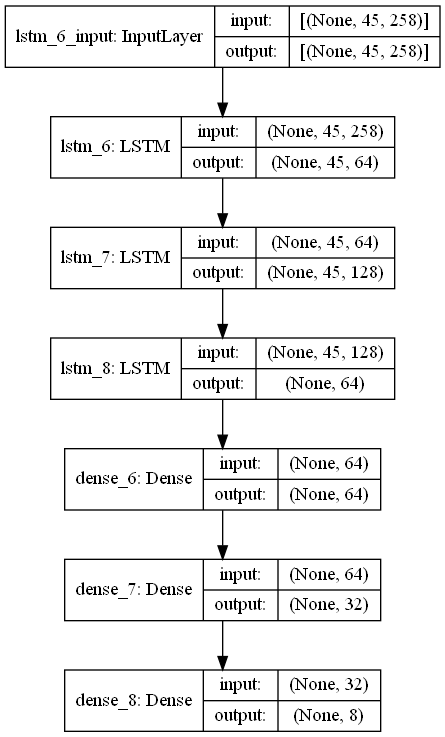

In [58]:
tf.keras.utils.plot_model(model, to_file='dot_img_file.png', show_shapes=True)

In [35]:
from sklearn.metrics import multilabel_confusion_matrix, accuracy_score, classification_report

In [42]:
yhat = model.predict(X_test)

In [43]:
ytrue = np.argmax(Y_test, axis=1).tolist()
yhat = np.argmax(yhat, axis=1).tolist()

In [44]:
multilabel_confusion_matrix(ytrue, yhat)

array([[[111,   0],
        [  0,  17]],

       [[117,   0],
        [  1,  10]],

       [[109,   1],
        [  0,  18]],

       [[112,   1],
        [  0,  15]],

       [[113,   0],
        [  1,  14]],

       [[108,   0],
        [  0,  20]],

       [[112,   0],
        [  0,  16]],

       [[112,   0],
        [  0,  16]]], dtype=int64)

In [45]:
print(classification_report(ytrue, yhat, target_names = list(label_map.keys())))

              precision    recall  f1-score   support

       Hello       1.00      1.00      1.00        17
           I       1.00      0.91      0.95        11
   Thank You       0.95      1.00      0.97        18
        Deaf       0.94      1.00      0.97        15
        Work       1.00      0.93      0.97        15
       Study       1.00      1.00      1.00        20
        Good       1.00      1.00      1.00        16
         Bad       1.00      1.00      1.00        16

    accuracy                           0.98       128
   macro avg       0.99      0.98      0.98       128
weighted avg       0.99      0.98      0.98       128



In [46]:
accuracy_score(yhat, ytrue)

0.984375

In [79]:
del model

In [9]:
model.load_weights('isl_lstm_basic.h5')

In [10]:
from scipy import stats

colors = [(245,117,16), (117,245,16), (16,117,245)]
def prob_viz(res, actions, input_frame, colors):
    output_frame = input_frame.copy()
    for num, prob in enumerate(res):
        cv2.rectangle(output_frame, (0,60+num*40), (int(prob*100), 90+num*40), colors[num], -1)
        cv2.putText(output_frame, actions[num], (0, 85+num*40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
        
    return output_frame

In [11]:
actions = list(label_map.keys())

In [12]:
def extract_keypoints(results):
    pose = np.array([[res.x, res.y, res.z, res.visibility] for res in results.pose_landmarks.landmark]).flatten() if results.pose_landmarks else np.zeros(33*4)
    lh = np.array([[res.x, res.y, res.z] for res in results.left_hand_landmarks.landmark]).flatten() if results.left_hand_landmarks else np.zeros(21*3)
    rh = np.array([[res.x, res.y, res.z] for res in results.right_hand_landmarks.landmark]).flatten() if results.right_hand_landmarks else np.zeros(21*3)
    return np.concatenate([pose, lh, rh])

In [12]:
import translators as ts

Using India server backend.


In [13]:
#english - en
#urdu - ur
#hindi - hi
#tamil - ta
#telugu - te
toLang = 'te'

In [13]:
# 1. New detection variables
sequence = []
sentence = []
predictions = []
threshold = 0.5
i = 0

cap = cv2.VideoCapture(0)
# Set mediapipe model 
with mp_holistic.Holistic(min_detection_confidence=0.7, min_tracking_confidence=0.7) as holistic:
    
    while cap.isOpened():
        
        i = i + 1
        # Read feed
        ret, frame = cap.read()
        # Make detections
        image, results = mp_detection(frame, holistic)
        
        # Draw landmarks
        draw_landmark(image, results)
        
        # 2. Prediction logic
        keypoints = extract_keypoints(results)
        sequence.append(keypoints)
        sequence = sequence[-45:]
        
        if len(sequence) == 45:
            res = model.predict(np.expand_dims(sequence, axis=0))[0]
            predictions.append(np.argmax(res))
            
            
            #3. Viz logic
            if np.unique(predictions[-10:])[0]==np.argmax(res): 
                if res[np.argmax(res)] > threshold: 
                    
                    if len(sentence) > 0:
                        if actions[np.argmax(res)] != sentence[-1]:
                            sentence.append(actions[np.argmax(res)])
                    else:
                        sentence.append(actions[np.argmax(res)])
                        
                    
            if len(sentence) > 5: 
                sentence = sentence[-5:]
            
        #if(i == 45):
            #i = 0
            #print(ts.google(' '.join(sentence), from_language = 'en', to_language = toLang))
            
        cv2.rectangle(image, (0,0), (640, 40), (245, 117, 16), -1)
        cv2.putText(image, ' '.join(sentence), (3,30), 
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
        # Show to screen
        cv2.imshow('OpenCV Feed', image)

        # Break gracefully
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
            
    cap.release()
    cv2.destroyAllWindows()

In [117]:
import threading 
import time

class RepeatedTimer(object):
  def __init__(self, interval, function, *args, **kwargs):
    self._timer = None
    self.interval = interval
    self.function = function
    self.args = args
    self.kwargs = kwargs
    self.is_running = False
    self.next_call = time.time()
    self.start()

  def _run(self):
    self.is_running = False
    self.start()
    self.function(*self.args, **self.kwargs)

  def start(self):
    if not self.is_running:
      self.next_call += self.interval
      self._timer = threading.Timer(self.next_call - time.time(), self._run)
      self._timer.start()
      self.is_running = True

  def stop(self):
    self._timer.cancel()
    self.is_running = False

In [118]:
from time import sleep

# 1. New detection variables
sequence = []
sentence = []
predictions = []
threshold = 0.5


def hello(sentence):
    print(ts.google(' '.join(sentence), from_language = 'en', to_language = 'hi'))

rt = RepeatedTimer(5, hello, sentence)
try:
    cap = cv2.VideoCapture(0)
    # Set mediapipe model 
    with mp_holistic.Holistic(min_detection_confidence=0.7, min_tracking_confidence=0.7) as holistic:
        while cap.isOpened():
        
            i = i + 1
            # Read feed
            ret, frame = cap.read()

            # Make detections
            image, results = mp_detection(frame, holistic)
        
            # Draw landmarks
            draw_landmark(image, results)
        
            # 2. Prediction logic
            keypoints = extract_keypoints(results)
            sequence.append(keypoints)
            sequence = sequence[-45:]
        
            if len(sequence) == 45:
                res = model.predict(np.expand_dims(sequence, axis=0))[0]
                predictions.append(np.argmax(res))
            
            
            #3. Viz logic
                if np.unique(predictions[-10:])[0]==np.argmax(res): 
                    if res[np.argmax(res)] > threshold: 
                    
                        if len(sentence) > 0: 
                            if actions[np.argmax(res)] != sentence[-1]:
                                sentence.append(actions[np.argmax(res)])
                        else:
                            sentence.append(actions[np.argmax(res)])
                        
                    
                if len(sentence) > 5: 
                    sentence = sentence[-5:]
            
                if(i == 45):
                    i = 0
                    print(ts.google(' '.join(sentence), from_language = 'en', to_language = 'hi'))
        
            cv2.rectangle(image, (0,0), (640, 40), (245, 117, 16), -1)
            cv2.putText(image, ' '.join(sentence), (3,30), 
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
            # Show to screen
            cv2.imshow('OpenCV Feed', image)

            # Break gracefully
            if cv2.waitKey(10) & 0xFF == ord('q'):
                break
        cap.release()
        cv2.destroyAllWindows()
finally:
    rt.stop() 

error: OpenCV(4.5.3) C:\Users\runneradmin\AppData\Local\Temp\pip-req-build-_xlv4eex\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [71]:
sequence = []
sentence = []
predictions = []
threshold = 0.5

def stream():
    cap = cv2.VideoCapture(0)
    # Set mediapipe model 
    with mp_holistic.Holistic(min_detection_confidence=0.7, min_tracking_confidence=0.7) as holistic:
        while cap.isOpened():
        
            i = i + 1
            # Read feed
            ret, frame = cap.read()

            # Make detections
            image, results = mp_detection(frame, holistic)
        
            # Draw landmarks
            draw_landmark(image, results)
        
            # 2. Prediction logic
            keypoints = extract_keypoints(results)
            sequence.append(keypoints)
            sequence = sequence[-45:]
        
            if len(sequence) == 45:
                res = model.predict(np.expand_dims(sequence, axis=0))[0]
                predictions.append(np.argmax(res))
            
            
            #3. Viz logic
                if np.unique(predictions[-10:])[0]==np.argmax(res): 
                    if res[np.argmax(res)] > threshold: 
                    
                        if len(sentence) > 0: 
                            if actions[np.argmax(res)] != sentence[-1]:
                                sentence.append(actions[np.argmax(res)])
                        else:
                            sentence.append(actions[np.argmax(res)])
                        
                    
                if len(sentence) > 5: 
                    sentence = sentence[-5:]
            
                
        
            cv2.rectangle(image, (0,0), (640, 40), (245, 117, 16), -1)
            cv2.putText(image, ' '.join(sentence), (3,30), 
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
            # Show to screen
            cv2.imshow('OpenCV Feed', image)

            # Break gracefully
            if cv2.waitKey(10) & 0xFF == ord('q'):
                break
        cap.release()
        cv2.destroyAllWindows()

def translate():
    print(ts.google(' '.join(sentence), from_language = 'en', to_language = 'hi'))

In [1]:
!pip install keytotext

  Using cached torch-1.9.1-cp37-cp37m-win_amd64.whl (222.0 MB)
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8786 sha256=2e073a80a658d796d091ec425eaed9a7ad9c64c8f9d0da133e5968655f0bd233
  Stored in directory: c:\users\paras\appdata\local\pip\cache\wheels\3e\31\09\fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
  Created wheel for promise: filename=promise-2.3-py3-none-any.whl size=21495 sha256=eb620fe32bdc5dc256a6f395d1902a74aa1a80720aee34ac6b2035b5792bf1ba
  Stored in directory: c:\users\paras\appdata\local\pip\cache\wheels\29\93\c6\762e359f8cb6a5b69c72235d798804cae523bbe41c2aa8333d
  Created wheel for subprocess32: filename=subprocess32-3.5.4-py3-none-any.whl size=6490 sha256=3f7297287c158a1db42982209749bcb4c5f5032b2b3765665ab327d33458bacb
  Stored in directory: c:\users\paras\appdata\local\pip\cache\wheels\50\ca\fa\8fca8d246e64f19488d07567547ddec8eb084e8c0d7a59226a
Successfully built pathtools promise subprocess32
  Attempting uninstall: yarl
    F

In [3]:
from keytotext import pipeline
nlp = pipeline("k2t-base")

INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2


Global seed set to 42


Downloading:   0%|          | 0.00/1.17k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.32M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/850M [00:00<?, ?B/s]

In [12]:
params = {"do_sample":True, "num_beams":4, "no_repeat_ngram_size":3, "early_stopping":True}

In [15]:
print (nlp(['Hello', 'I', 'Deaf', 'Work'], **params)) 

Hello| I| Deaf is a Work album.
